In [2]:
import os
import gzip
import pickle
import numpy as np
import torch
from urllib.request import urlretrieve
import matplotlib.pyplot as plt
from tqdm import tqdm
from ebm.model import Network
import networkx as nx
from ebm.external_world import ExternalWorld, MNISTExternalWorld

from ebm.train_model import *


def pi(s):
    return torch.clamp(s, 0.0, 1.0)

class ExternalWorld:
    def __init__(self, x_values, y_values):
        self.x = torch.tensor(x_values, dtype=torch.float32)
        self.y = torch.tensor(y_values, dtype=torch.int64)
        self.size_dataset = len(self.x)



In [9]:
def train_net(net: Network, plot_graph = False):
    history = {"Energy": [], "Cost": [], "Error": []}
    epochs, batch_size = net.hyperparameters["n_epochs"], net.hyperparameters["batch_size"]
    n_batches = net.dataset_size // batch_size
    n_it_neg, n_it_pos, alphas = net.hyperparameters["n_it_neg"], net.hyperparameters["n_it_pos"], net.hyperparameters["alphas"]


    snapshot_epochs = np.linspace(0, epochs - 1, 5, dtype=int)
    with tqdm(total=epochs, desc="Training Progress", unit="epoch") as epoch_bar:
        for epoch in range(epochs):
            for i in range(n_batches):
                net.update_mini_batch_index(i)
                net.negative_phase(n_it_neg)
                net.positive_phase(n_it_pos, *alphas)

                for i in range(0,len(net.biases)):
                    net.biases[i]*= 0 
                net.weights[-1] = torch.tensor([[-1.,1.]]) 
                
                # = [
                #     torch.tensor([[-1.,  1.],
                #                 [ 1., -1.]]),           # Input → Hidden
                #     torch.tensor([[1.],
                #                 [1.]]),            # Hidden → Output
                #     torch.tensor([[-1.,1.]])    # Final classifier layer (if used)
                # ]


            # Measure and log
            E, C, error = net.measure()
            history["Energy"].append(E)
            history["Cost"].append(C)
            history["Error"].append(error * 100)

            # Update progress bar description instead of using set_postfix()
            epoch_bar.set_description(f"Epoch {epoch+1}/{epochs} | E={E:.2f} C={C:.5f} Error={error*100:.2f}%")
            epoch_bar.update(1)
            if(plot_graph):
                if epoch in snapshot_epochs:
                    plot_network_weights(net, epoch)

    # Plot results
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))
    for ax, (key, color) in zip(axes, [("Energy", "blue"), ("Cost", "orange"), ("Error", "red")]):
        ax.plot(history[key], label=key, color=color)
        ax.set_title(f"{key} over Epochs")
    plt.tight_layout()
    plt.show()

In [10]:
import torch.nn as nn
# XOR dataset
xor_x = np.array([[0, 0], [0, 1], [1, 0], [1, 1]] * 10, dtype=np.float32)
xor_y = np.array([0, 1, 1, 0] * 10, dtype=np.int64)

# ExternalWorld instance with XOR data
xor_world = ExternalWorld(xor_x, xor_y)



# # small nets can solve xor
# xor_net = Network(
#     name="xor_net",
#     external_world=xor_world,
#     hyperparameters={
#         "hidden_sizes": [2, 1],
#         "output_size": 2,
#         "batch_size": 4,
#         "n_epochs": 100,
#         "n_it_neg": 1,
#         "n_it_pos": 1,
#         "alphas": [np.float32(0.1), np.float32(0.1),  np.float32(0.05)]
#     }
# )


tensor([-1., -1., -1., -1., -1., -1.])


Epoch 1/5 | E=0.50 C=1.00000 Error=50.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

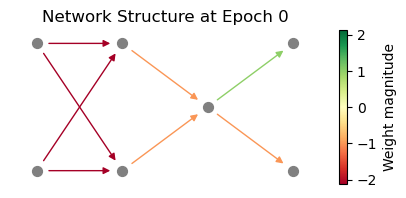

Epoch 2/5 | E=0.50 C=1.00000 Error=50.00%:  20%|██        | 1/5 [00:00<00:00, 12.38epoch/s]

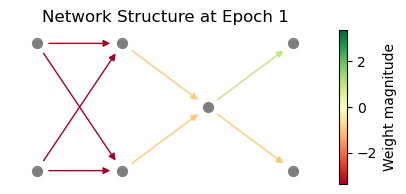

Epoch 3/5 | E=0.50 C=1.00000 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 22.61epoch/s]

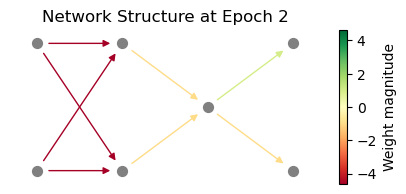

Epoch 4/5 | E=0.50 C=1.00000 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 22.61epoch/s]

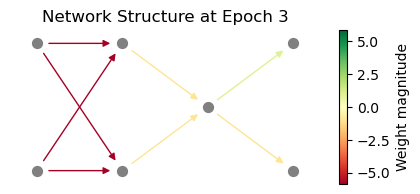

Epoch 5/5 | E=0.50 C=1.00000 Error=50.00%:  80%|████████  | 4/5 [00:00<00:00, 22.61epoch/s]

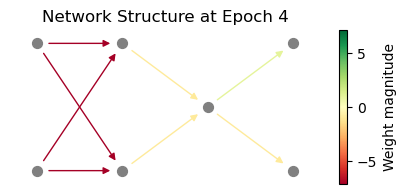

Epoch 5/5 | E=0.50 C=1.00000 Error=50.00%: 100%|██████████| 5/5 [00:00<00:00, 17.45epoch/s]


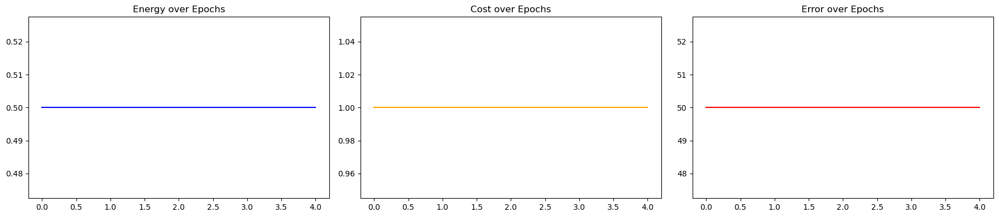

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-7.1249, -7.1249],
        [-7.1249, -7.1249]]), tensor([[-1.],
        [-1.]]), tensor([[-1.,  1.]])]
tensor([-1., -1., -1., -1., -1.,  1.])


Epoch 1/5 | E=0.50 C=1.00000 Error=50.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

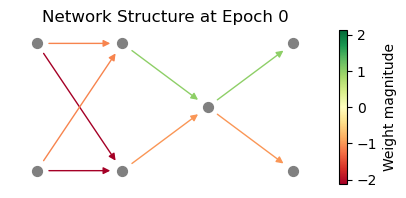

Epoch 2/5 | E=0.50 C=1.00000 Error=50.00%:  20%|██        | 1/5 [00:00<00:00, 18.30epoch/s]

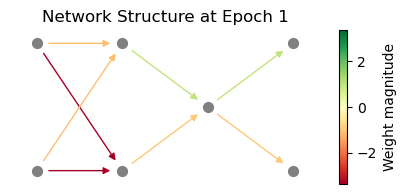

Epoch 3/5 | E=0.50 C=1.00000 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 28.42epoch/s]

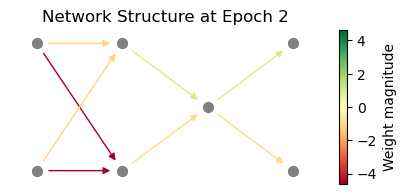

Epoch 4/5 | E=0.50 C=1.00000 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 28.42epoch/s]

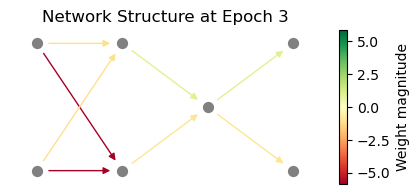

Epoch 5/5 | E=0.50 C=1.00000 Error=50.00%:  80%|████████  | 4/5 [00:00<00:00, 28.42epoch/s]

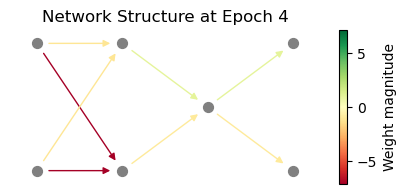

Epoch 5/5 | E=0.50 C=1.00000 Error=50.00%: 100%|██████████| 5/5 [00:00<00:00, 16.45epoch/s]


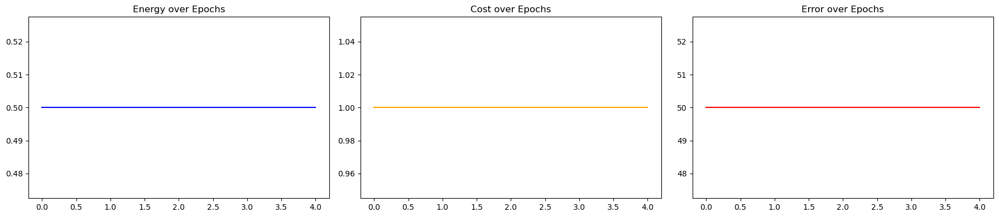

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-7.1249, -1.1250],
        [-7.1249, -1.1250]]), tensor([[-1.],
        [ 1.]]), tensor([[-1.,  1.]])]
tensor([-1., -1., -1., -1.,  1., -1.])


Epoch 1/5 | E=0.50 C=1.00000 Error=50.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

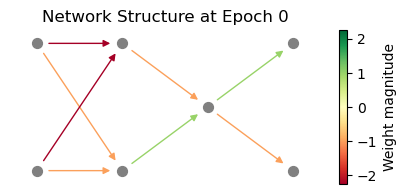

Epoch 2/5 | E=0.50 C=1.00000 Error=50.00%:  20%|██        | 1/5 [00:00<00:00, 17.35epoch/s]

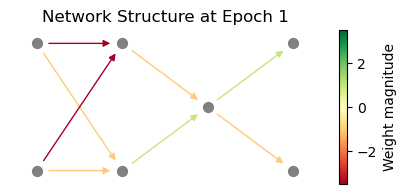

Epoch 3/5 | E=0.50 C=1.00000 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 27.52epoch/s]

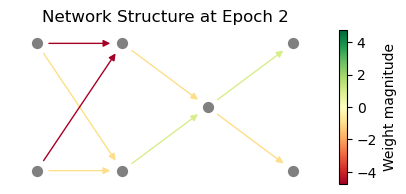

Epoch 4/5 | E=0.50 C=1.00000 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 27.52epoch/s]

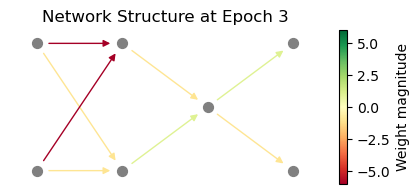

Epoch 5/5 | E=0.50 C=1.00000 Error=50.00%:  80%|████████  | 4/5 [00:00<00:00, 27.52epoch/s]

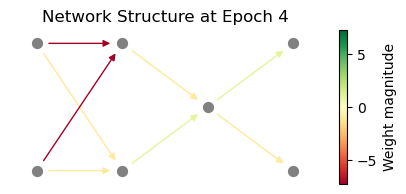

Epoch 5/5 | E=0.50 C=1.00000 Error=50.00%: 100%|██████████| 5/5 [00:00<00:00, 17.60epoch/s]


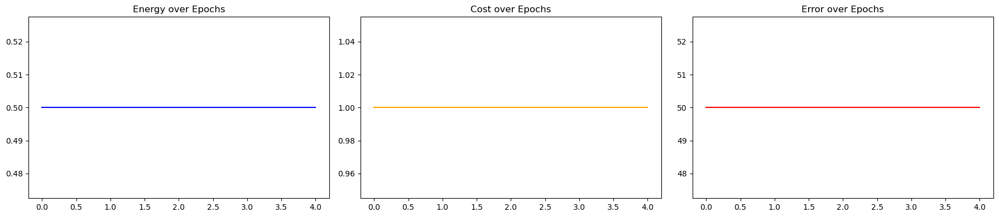

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0000, -7.2499],
        [-1.0000, -7.2499]]), tensor([[ 1.],
        [-1.]]), tensor([[-1.,  1.]])]
tensor([-1., -1., -1., -1.,  1.,  1.])


Epoch 1/5 | E=0.50 C=1.00000 Error=50.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

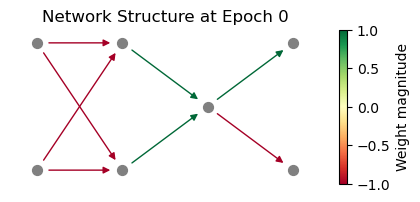

Epoch 2/5 | E=0.50 C=1.00000 Error=50.00%:  20%|██        | 1/5 [00:00<00:00, 16.83epoch/s]

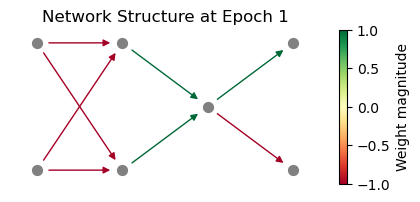

Epoch 3/5 | E=0.50 C=1.00000 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 26.58epoch/s]

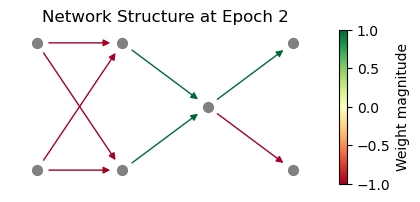

Epoch 4/5 | E=0.50 C=1.00000 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 26.58epoch/s]

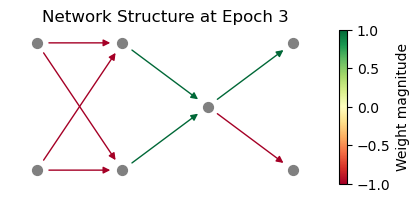

Epoch 5/5 | E=0.50 C=1.00000 Error=50.00%:  80%|████████  | 4/5 [00:00<00:00, 26.58epoch/s]

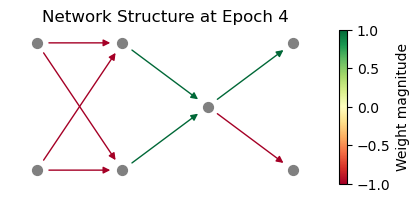

Epoch 5/5 | E=0.50 C=1.00000 Error=50.00%: 100%|██████████| 5/5 [00:00<00:00, 17.08epoch/s]


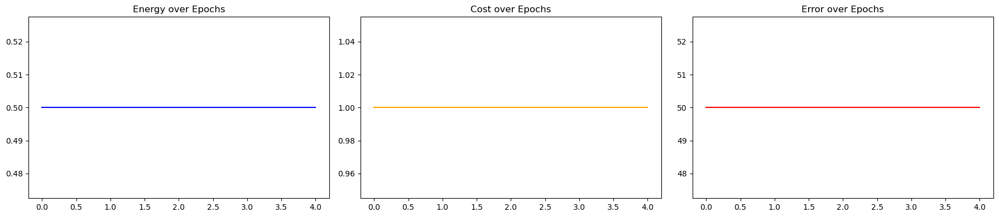

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1., -1.],
        [-1., -1.]]), tensor([[1.],
        [1.]]), tensor([[-1.,  1.]])]
tensor([-1., -1., -1.,  1., -1., -1.])


Epoch 1/5 | E=0.30 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

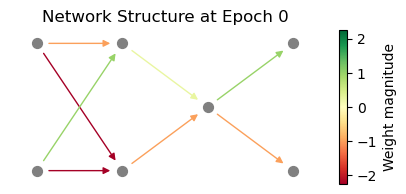

Epoch 2/5 | E=0.34 C=0.56255 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.10epoch/s]

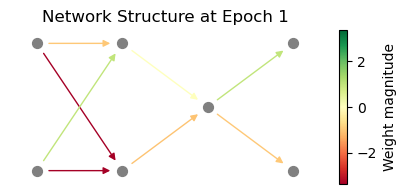

Epoch 3/5 | E=0.32 C=0.56252 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 14.78epoch/s]

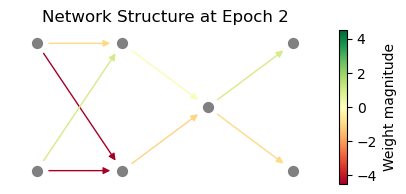

Epoch 4/5 | E=0.39 C=1.06229 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 14.78epoch/s]

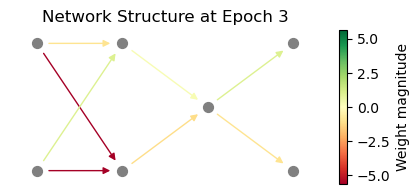

Epoch 5/5 | E=0.34 C=0.56254 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 16.09epoch/s]

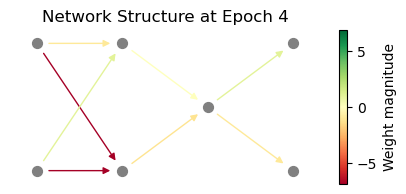

Epoch 5/5 | E=0.34 C=0.56254 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.77epoch/s]


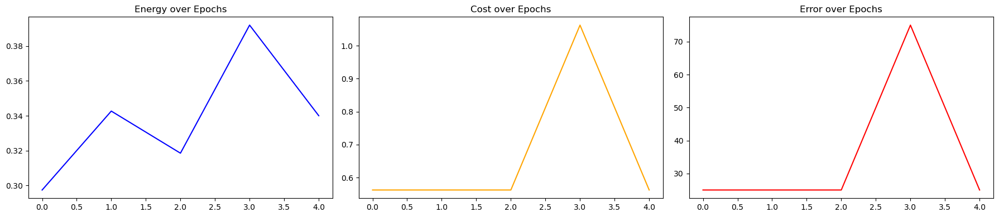

[tensor([0., 0.]), tensor([0., -0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-6.8749, -1.0000],
        [-6.8749,  1.0000]]), tensor([[-1.1857],
        [ 0.0199]]), tensor([[-1.,  1.]])]
tensor([-1., -1., -1.,  1., -1.,  1.])


Epoch 1/5 | E=0.24 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

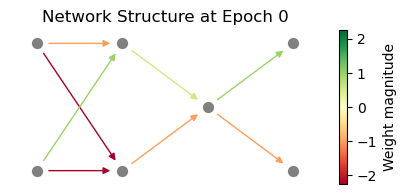

Epoch 2/5 | E=0.35 C=0.56264 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.42epoch/s]

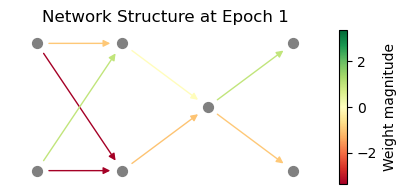

Epoch 3/5 | E=0.33 C=0.56252 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 27.72epoch/s]

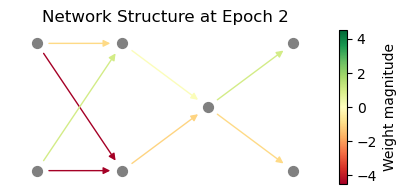

Epoch 4/5 | E=0.30 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 27.72epoch/s]

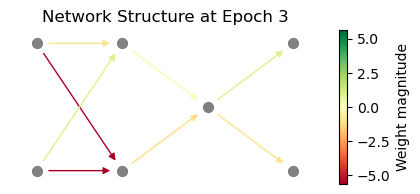

Epoch 5/5 | E=0.35 C=0.56257 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 27.72epoch/s]

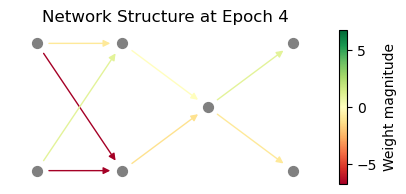

Epoch 5/5 | E=0.35 C=0.56257 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 17.81epoch/s]


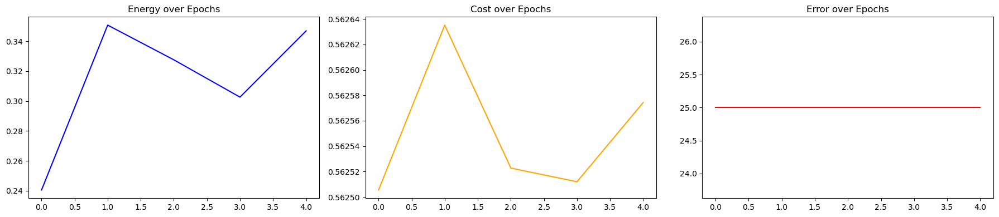

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-6.7499, -1.0000],
        [-6.7499,  1.0000]]), tensor([[-1.2457],
        [-0.0169]]), tensor([[-1.,  1.]])]
tensor([-1., -1., -1.,  1.,  1., -1.])


Epoch 1/5 | E=0.33 C=0.56253 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

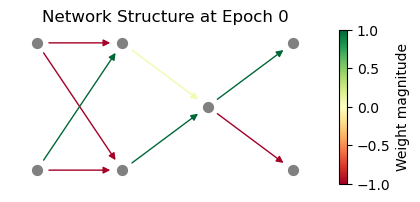

Epoch 2/5 | E=0.31 C=0.56251 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.58epoch/s]

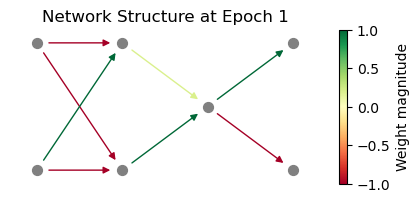

Epoch 3/5 | E=0.35 C=0.56282 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 27.16epoch/s]

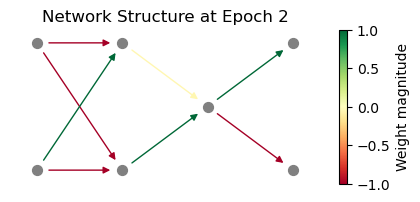

Epoch 4/5 | E=0.33 C=0.56253 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 27.16epoch/s]

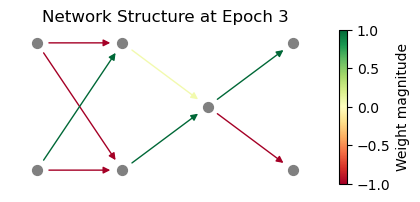

Epoch 5/5 | E=0.31 C=0.56251 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 27.16epoch/s]

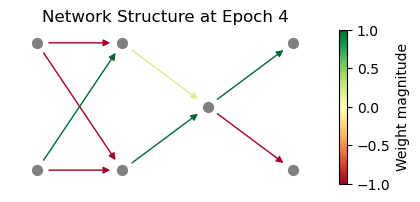

Epoch 5/5 | E=0.31 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 17.54epoch/s]


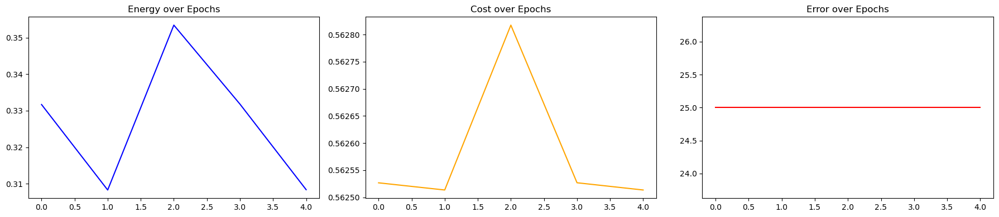

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0000, -1.0000],
        [-1.0000,  1.0000]]), tensor([[1.0000],
        [0.1886]]), tensor([[-1.,  1.]])]
tensor([-1., -1., -1.,  1.,  1.,  1.])


Epoch 1/5 | E=0.29 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

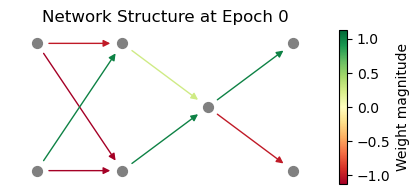

Epoch 2/5 | E=0.34 C=0.56253 Error=25.00%:  40%|████      | 2/5 [00:00<00:00, 16.16epoch/s]

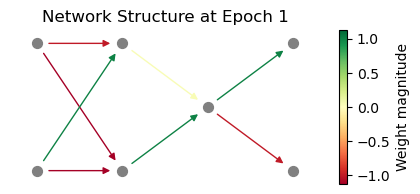

Epoch 3/5 | E=0.31 C=0.56251 Error=25.00%:  40%|████      | 2/5 [00:00<00:00, 16.16epoch/s]

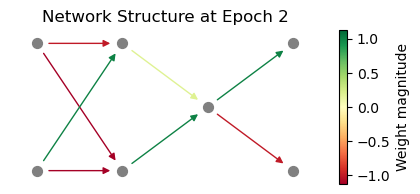

Epoch 4/5 | E=0.35 C=0.56312 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 17.34epoch/s]

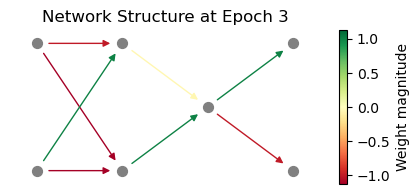

Epoch 5/5 | E=0.33 C=0.56253 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 17.34epoch/s]

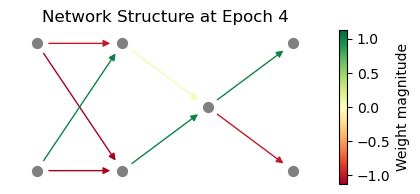

Epoch 5/5 | E=0.33 C=0.56253 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.84epoch/s]


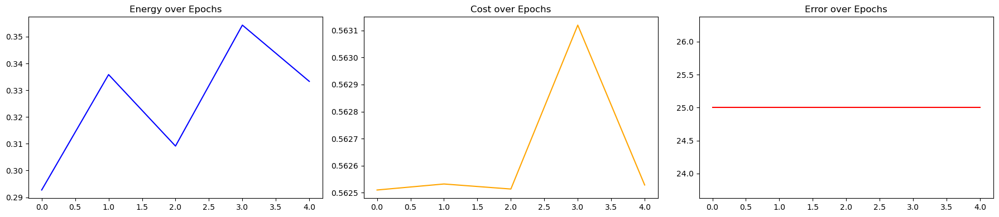

[tensor([0., 0.]), tensor([0., -0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.1250, -1.0000],
        [-1.1250,  1.0000]]), tensor([[1.0000],
        [0.0557]]), tensor([[-1.,  1.]])]
tensor([-1., -1.,  1., -1., -1., -1.])


Epoch 1/5 | E=0.32 C=0.56252 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

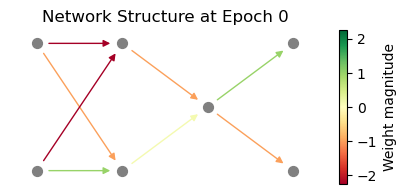

Epoch 2/5 | E=0.39 C=1.06231 Error=75.00%:  20%|██        | 1/5 [00:00<00:00, 17.77epoch/s]

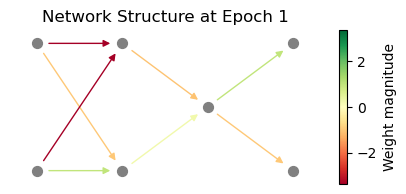

Epoch 3/5 | E=0.34 C=0.56254 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 24.64epoch/s]

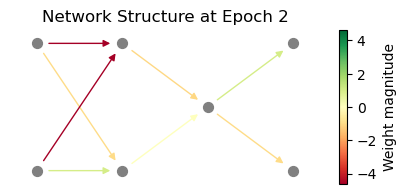

Epoch 4/5 | E=0.32 C=0.56252 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 24.64epoch/s]

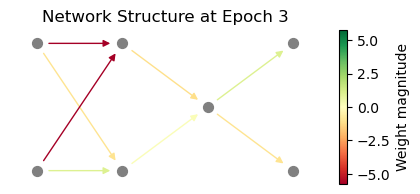

Epoch 5/5 | E=0.40 C=1.06219 Error=75.00%:  80%|████████  | 4/5 [00:00<00:00, 24.64epoch/s]

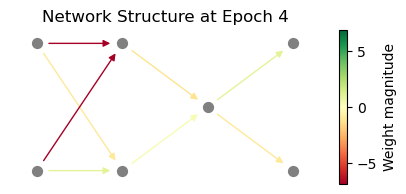

Epoch 5/5 | E=0.40 C=1.06219 Error=75.00%: 100%|██████████| 5/5 [00:00<00:00, 16.57epoch/s]


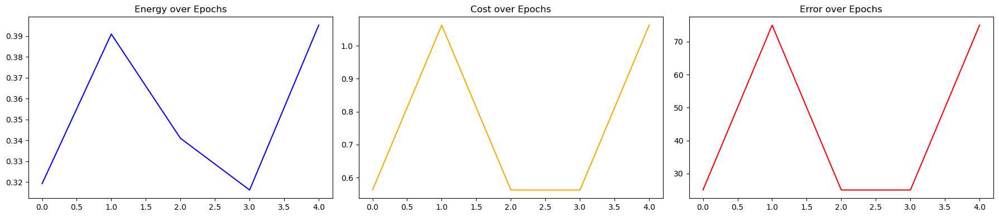

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0000, -6.8749],
        [ 1.0000, -6.8749]]), tensor([[ 0.2751],
        [-1.1860]]), tensor([[-1.,  1.]])]
tensor([-1., -1.,  1., -1., -1.,  1.])


Epoch 1/5 | E=0.30 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

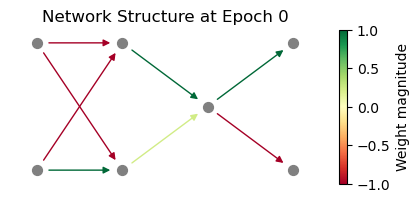

Epoch 2/5 | E=0.34 C=0.56255 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.21epoch/s]

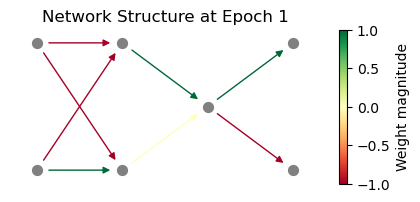

Epoch 3/5 | E=0.32 C=0.56252 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 23.64epoch/s]

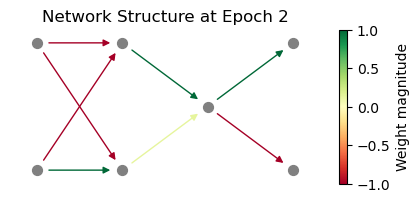

Epoch 4/5 | E=0.39 C=1.06230 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 23.64epoch/s]

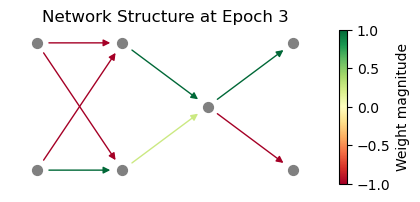

Epoch 5/5 | E=0.39 C=1.06224 Error=75.00%:  80%|████████  | 4/5 [00:00<00:00, 23.64epoch/s]

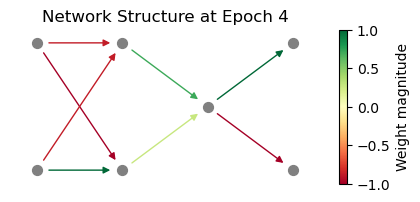

Epoch 5/5 | E=0.39 C=1.06224 Error=75.00%: 100%|██████████| 5/5 [00:00<00:00, 16.18epoch/s]


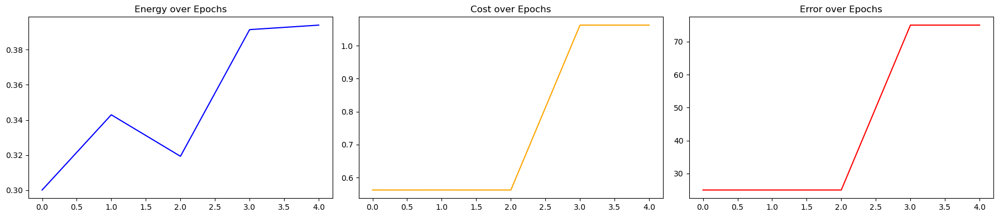

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0000, -0.8750],
        [ 1.0000, -0.8750]]), tensor([[0.2684],
        [0.7046]]), tensor([[-1.,  1.]])]
tensor([-1., -1.,  1., -1.,  1., -1.])


Epoch 1/5 | E=0.30 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

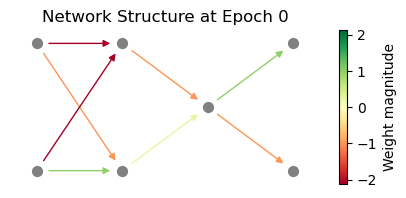

Epoch 2/5 | E=0.34 C=0.56255 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 16.47epoch/s]

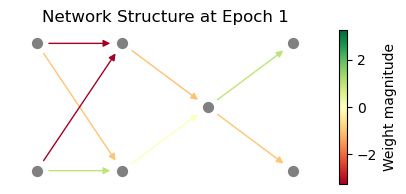

Epoch 3/5 | E=0.32 C=0.56252 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 16.96epoch/s]

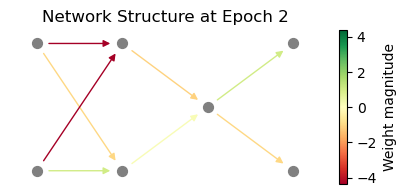

Epoch 4/5 | E=0.39 C=1.06226 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 16.96epoch/s]

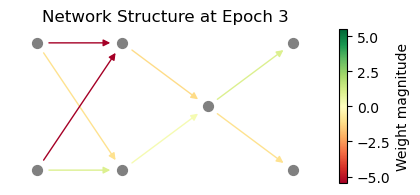

Epoch 5/5 | E=0.34 C=0.56254 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 16.46epoch/s]

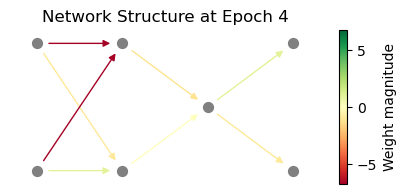

Epoch 5/5 | E=0.34 C=0.56254 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.30epoch/s]


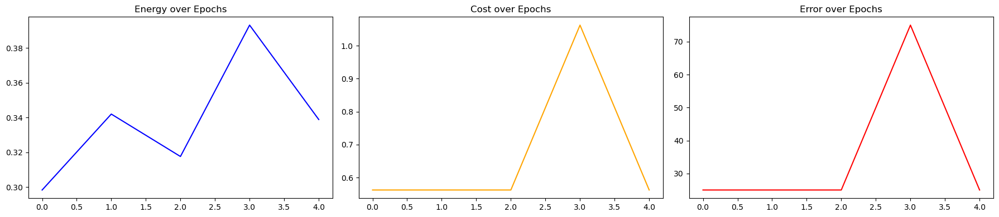

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0000, -6.7499],
        [ 1.0000, -6.7499]]), tensor([[ 0.0258],
        [-1.1858]]), tensor([[-1.,  1.]])]
tensor([-1., -1.,  1., -1.,  1.,  1.])


Epoch 1/5 | E=0.25 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

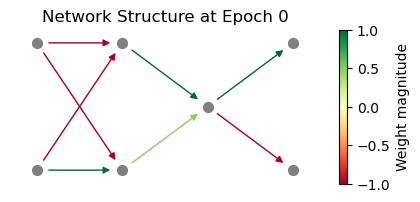

Epoch 2/5 | E=0.39 C=1.06227 Error=75.00%:  20%|██        | 1/5 [00:00<00:00, 18.16epoch/s]

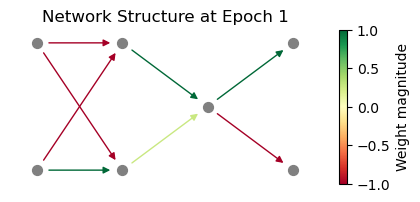

Epoch 3/5 | E=0.40 C=1.06217 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 26.54epoch/s]

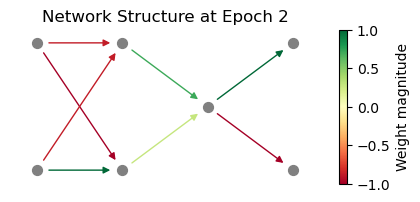

Epoch 4/5 | E=0.40 C=1.06188 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 26.54epoch/s]

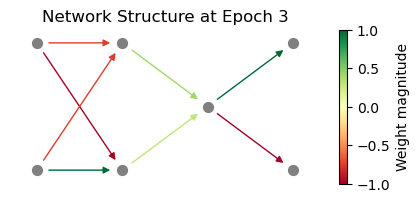

Epoch 5/5 | E=0.35 C=0.56276 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 26.54epoch/s]

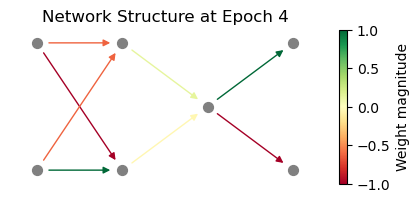

Epoch 5/5 | E=0.35 C=0.56276 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 16.04epoch/s]


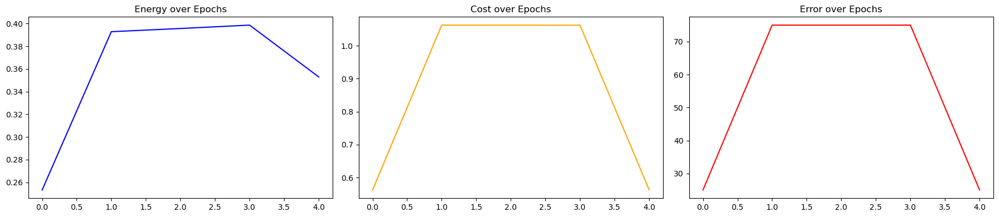

[tensor([0., 0.]), tensor([-0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[-1.0000, -0.6250],
        [ 1.0000, -0.6250]]), tensor([[-0.0493],
        [ 0.1279]]), tensor([[-1.,  1.]])]
tensor([-1., -1.,  1.,  1., -1., -1.])


Epoch 1/5 | E=0.12 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

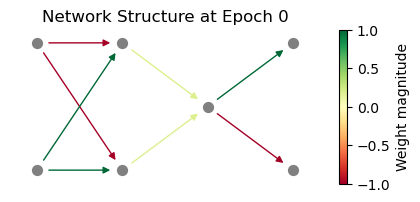

Epoch 2/5 | E=0.21 C=0.56273 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.03epoch/s]

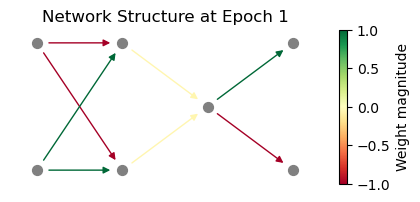

Epoch 3/5 | E=0.17 C=0.56252 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.92epoch/s]

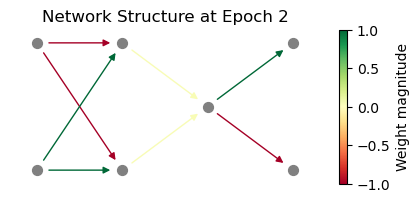

Epoch 4/5 | E=0.11 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.92epoch/s]

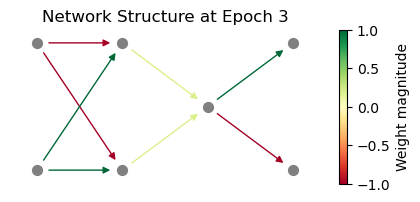

Epoch 5/5 | E=0.20 C=0.56256 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 22.92epoch/s]

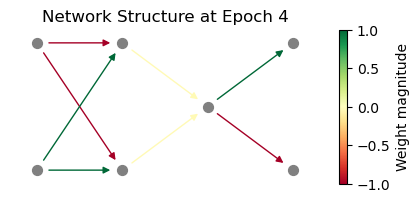

Epoch 5/5 | E=0.20 C=0.56256 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 16.43epoch/s]


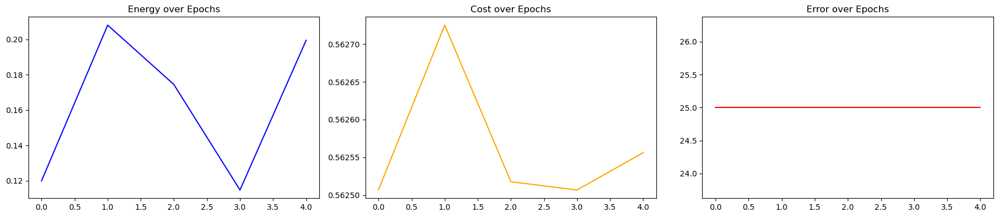

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[-1.0000, -1.0000],
        [ 1.0000,  1.0000]]), tensor([[-0.0318],
        [-0.0318]]), tensor([[-1.,  1.]])]
tensor([-1., -1.,  1.,  1., -1.,  1.])


Epoch 1/5 | E=0.21 C=0.56266 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

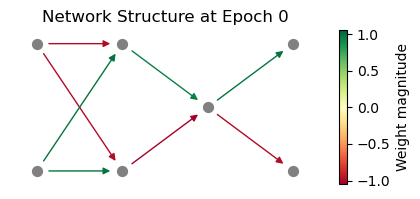

Epoch 2/5 | E=0.18 C=0.56252 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 12.02epoch/s]

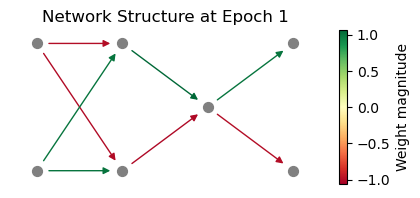

Epoch 3/5 | E=0.15 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.82epoch/s]

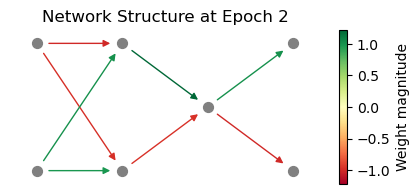

Epoch 4/5 | E=0.19 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.82epoch/s]

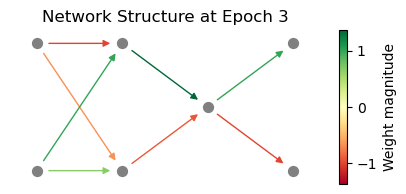

Epoch 5/5 | E=0.11 C=0.56250 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 21.82epoch/s]

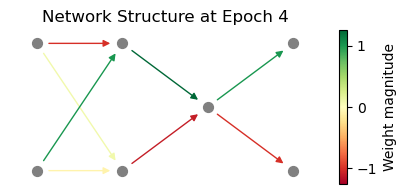

Epoch 5/5 | E=0.11 C=0.56250 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 12.49epoch/s]


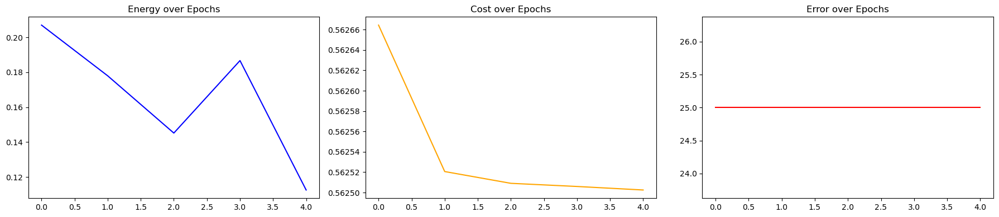

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 0.0885, -1.0000],
        [-0.0885,  1.0000]]), tensor([[-1.0888],
        [ 1.2521]]), tensor([[-1.,  1.]])]
tensor([-1., -1.,  1.,  1.,  1., -1.])


Epoch 1/5 | E=0.17 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

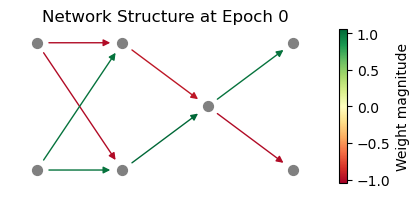

Epoch 2/5 | E=0.14 C=0.56251 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.28epoch/s]

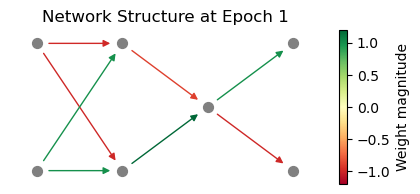

Epoch 3/5 | E=0.32 C=1.06239 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 21.92epoch/s]

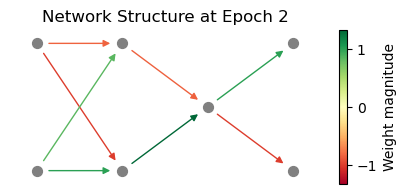

Epoch 4/5 | E=0.31 C=1.06202 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 21.92epoch/s]

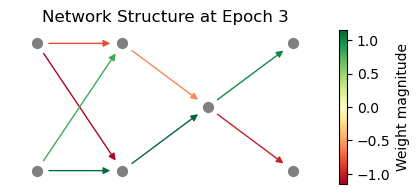

Epoch 5/5 | E=0.13 C=0.56251 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 21.92epoch/s]

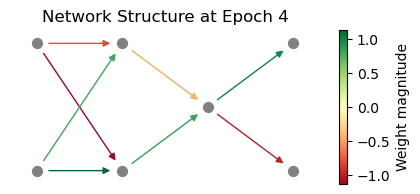

Epoch 5/5 | E=0.13 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 16.22epoch/s]


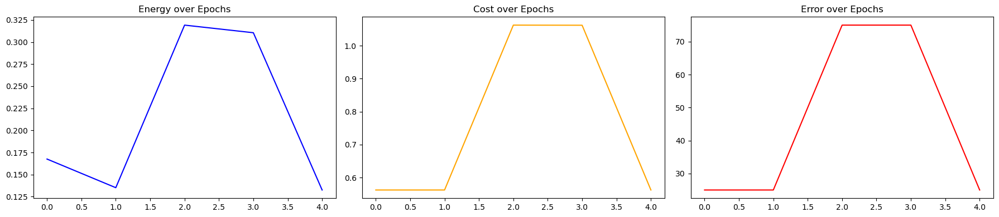

[tensor([0., 0.]), tensor([-0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.1363, -0.8057],
        [ 1.1364,  0.8058]]), tensor([[ 0.8306],
        [-0.4603]]), tensor([[-1.,  1.]])]
tensor([-1., -1.,  1.,  1.,  1.,  1.])


Epoch 1/5 | E=-0.03 C=0.56250 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

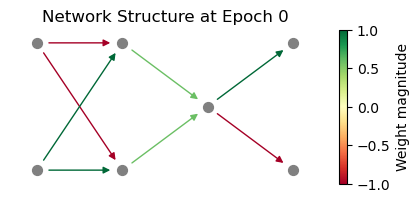

Epoch 2/5 | E=0.16 C=0.56251 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.33epoch/s]

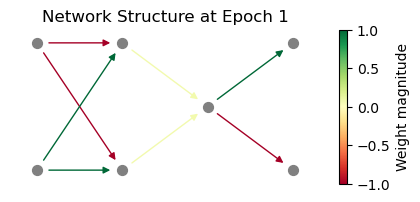

Epoch 3/5 | E=0.11 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.96epoch/s]

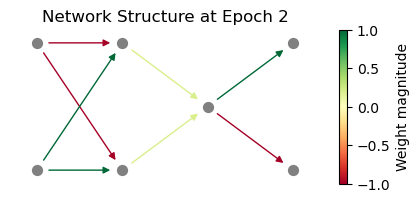

Epoch 4/5 | E=0.20 C=0.56255 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.96epoch/s]

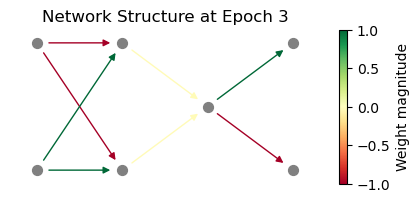

Epoch 5/5 | E=0.16 C=0.56251 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 22.96epoch/s]

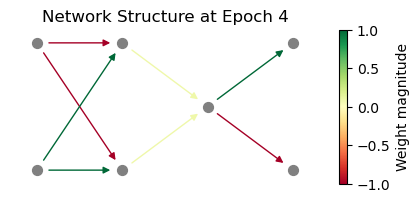

Epoch 5/5 | E=0.16 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 15.58epoch/s]


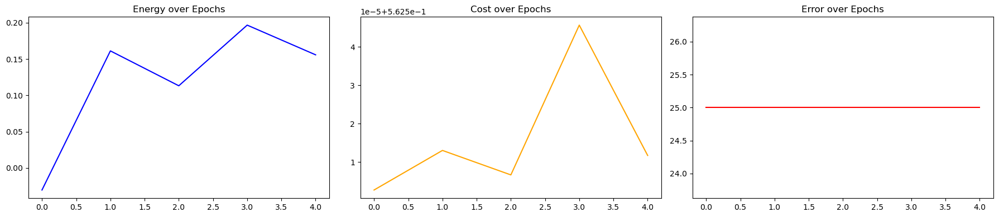

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0000, -1.0000],
        [ 1.0000,  1.0000]]), tensor([[0.0843],
        [0.0843]]), tensor([[-1.,  1.]])]
tensor([-1.,  1., -1., -1., -1., -1.])


Epoch 1/5 | E=0.34 C=0.56254 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

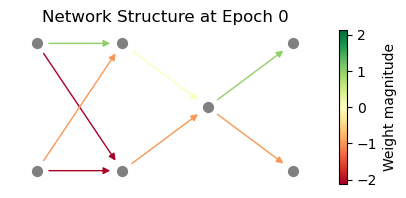

Epoch 2/5 | E=0.32 C=0.56252 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.49epoch/s]

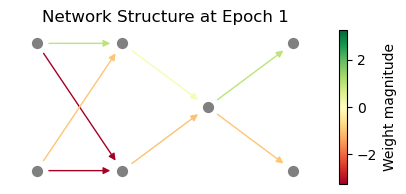

Epoch 3/5 | E=0.40 C=1.06215 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 21.11epoch/s]

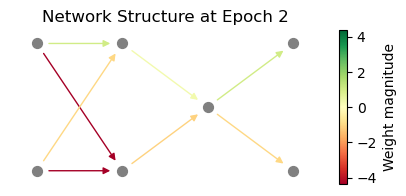

Epoch 4/5 | E=0.34 C=0.56253 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.11epoch/s]

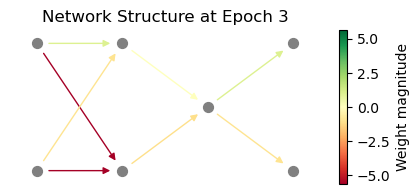

Epoch 5/5 | E=0.31 C=0.56251 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 21.11epoch/s]

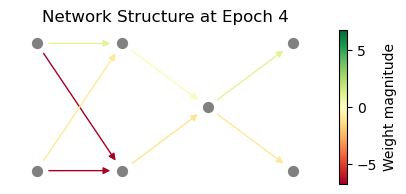

Epoch 5/5 | E=0.31 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 11.88epoch/s]


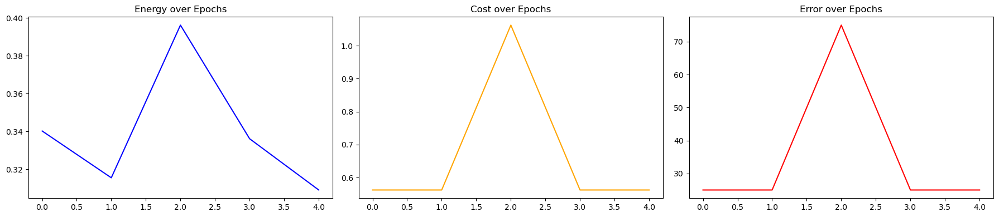

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[-6.7499,  1.0000],
        [-6.7499, -1.0000]]), tensor([[-1.1848],
        [ 0.1849]]), tensor([[-1.,  1.]])]
tensor([-1.,  1., -1., -1., -1.,  1.])


Epoch 1/5 | E=0.28 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

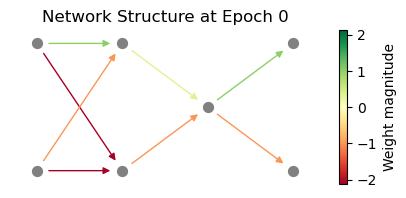

Epoch 2/5 | E=0.32 C=0.56252 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 15.43epoch/s]

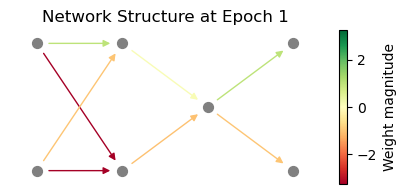

Epoch 3/5 | E=0.30 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 18.74epoch/s]

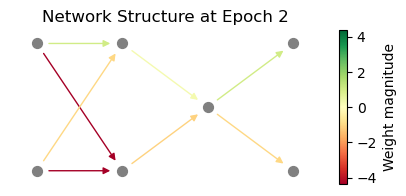

Epoch 4/5 | E=0.34 C=0.56255 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 18.74epoch/s]

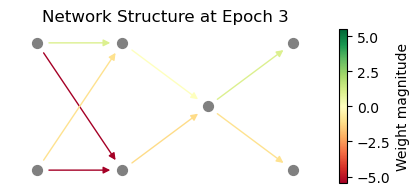

Epoch 5/5 | E=0.32 C=0.56252 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 17.08epoch/s]

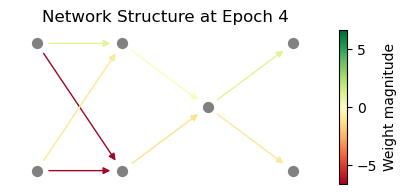

Epoch 5/5 | E=0.32 C=0.56252 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.71epoch/s]


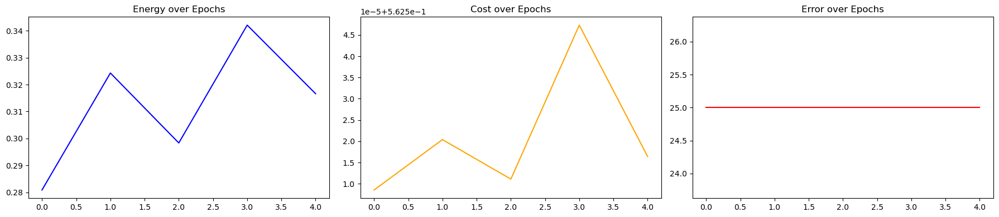

[tensor([0., 0.]), tensor([-0., -0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-6.6249,  1.0000],
        [-6.6249, -1.0000]]), tensor([[-1.2444],
        [ 0.1447]]), tensor([[-1.,  1.]])]
tensor([-1.,  1., -1., -1.,  1., -1.])


Epoch 1/5 | E=0.34 C=0.56254 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

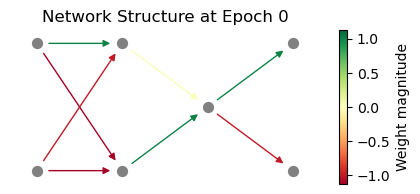

Epoch 2/5 | E=0.32 C=0.56252 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 16.70epoch/s]

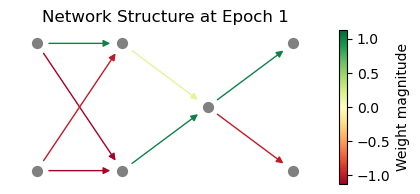

Epoch 3/5 | E=0.40 C=1.06210 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 22.45epoch/s]

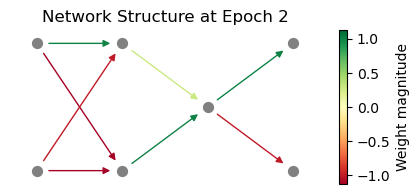

Epoch 4/5 | E=0.40 C=1.06118 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 22.45epoch/s]

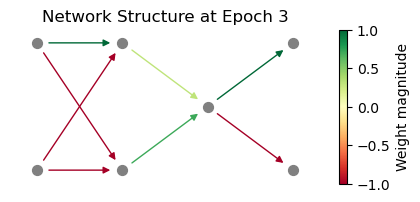

Epoch 5/5 | E=0.35 C=0.56286 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 22.45epoch/s]

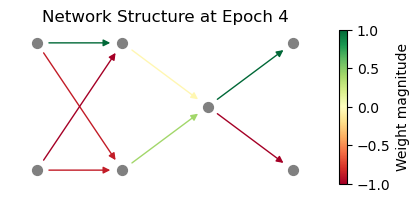

Epoch 5/5 | E=0.35 C=0.56286 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 15.70epoch/s]


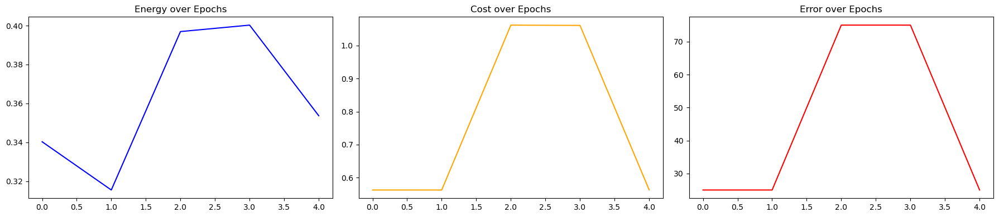

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-0.8750,  1.0000],
        [-0.8750, -1.0000]]), tensor([[ 0.4114],
        [-0.0529]]), tensor([[-1.,  1.]])]
tensor([-1.,  1., -1., -1.,  1.,  1.])


Epoch 1/5 | E=0.25 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

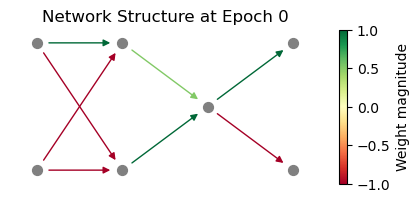

Epoch 2/5 | E=0.40 C=1.06103 Error=75.00%:  20%|██        | 1/5 [00:00<00:00, 15.50epoch/s]

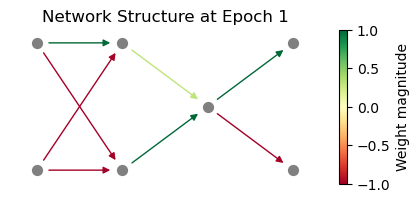

Epoch 3/5 | E=0.35 C=0.56275 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 20.40epoch/s]

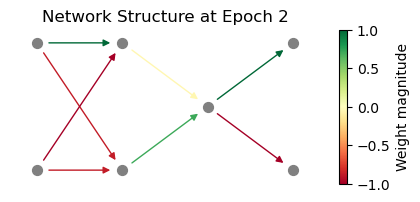

Epoch 4/5 | E=0.33 C=0.56253 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 20.40epoch/s]

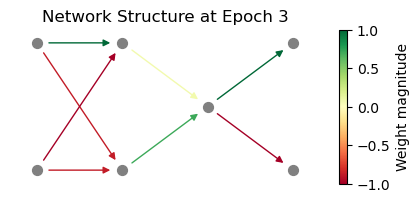

Epoch 5/5 | E=0.31 C=0.56251 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 20.40epoch/s]

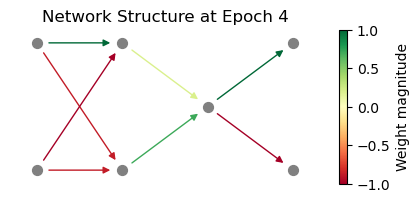

Epoch 5/5 | E=0.31 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 12.11epoch/s]


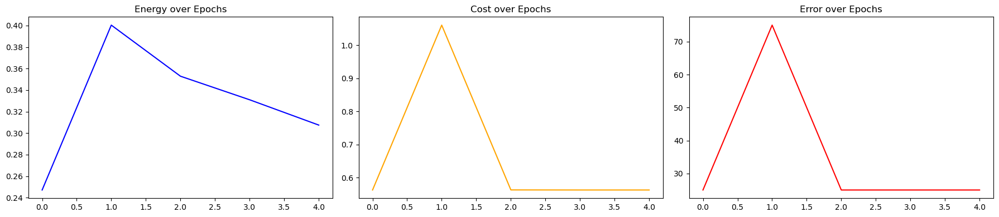

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-0.8750,  1.0000],
        [-0.8750, -1.0000]]), tensor([[0.7072],
        [0.1933]]), tensor([[-1.,  1.]])]
tensor([-1.,  1., -1.,  1., -1., -1.])


Epoch 1/5 | E=0.40 C=1.06238 Error=75.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

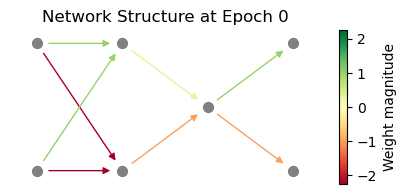

Epoch 2/5 | E=0.34 C=0.56266 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 12.85epoch/s]

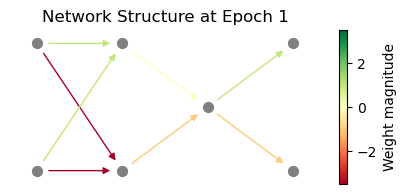

Epoch 3/5 | E=0.32 C=0.56256 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.55epoch/s]

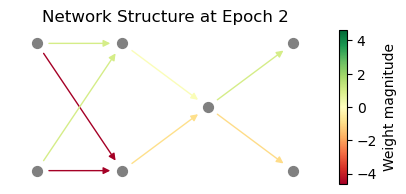

Epoch 4/5 | E=0.39 C=1.06244 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 22.55epoch/s]

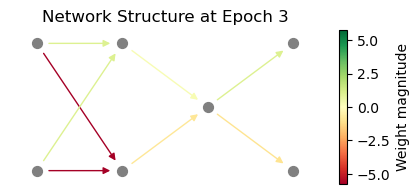

Epoch 5/5 | E=0.35 C=0.56274 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 22.55epoch/s]

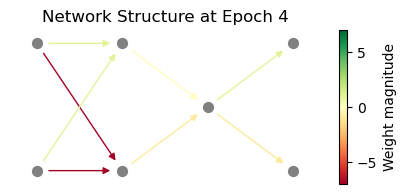

Epoch 5/5 | E=0.35 C=0.56274 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.41epoch/s]


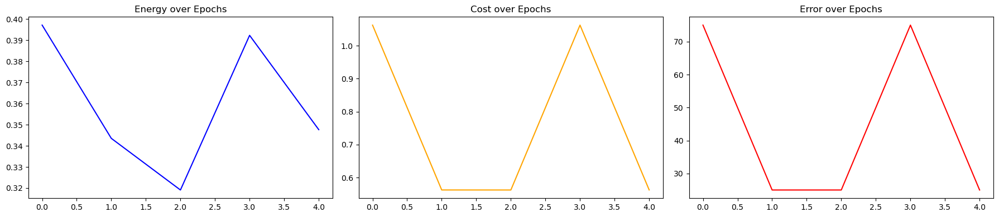

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-6.9999,  1.0000],
        [-6.9999,  1.0000]]), tensor([[-0.8750],
        [-0.0208]]), tensor([[-1.,  1.]])]
tensor([-1.,  1., -1.,  1., -1.,  1.])


Epoch 1/5 | E=0.27 C=0.56252 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

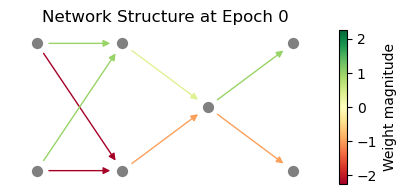

Epoch 2/5 | E=0.32 C=0.56255 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 12.52epoch/s]

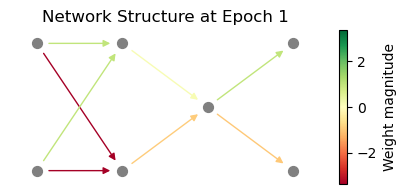

Epoch 3/5 | E=0.39 C=1.06242 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 22.01epoch/s]

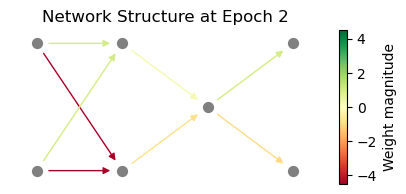

Epoch 4/5 | E=0.35 C=0.56270 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.01epoch/s]

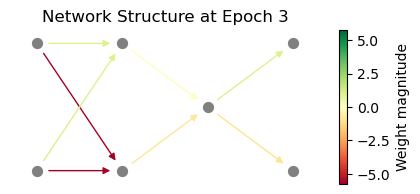

Epoch 5/5 | E=0.32 C=0.56256 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 22.01epoch/s]

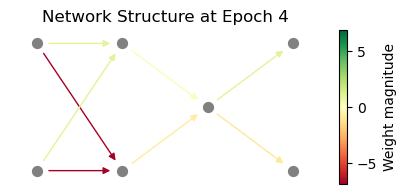

Epoch 5/5 | E=0.32 C=0.56256 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 15.06epoch/s]


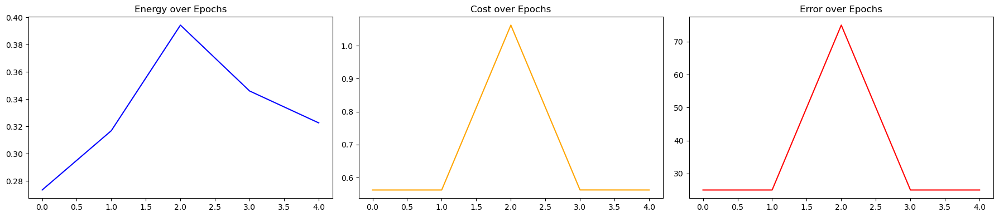

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[-6.8749,  1.0000],
        [-6.8749,  1.0000]]), tensor([[-0.8125],
        [ 0.1129]]), tensor([[-1.,  1.]])]
tensor([-1.,  1., -1.,  1.,  1., -1.])


Epoch 1/5 | E=0.34 C=0.56268 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

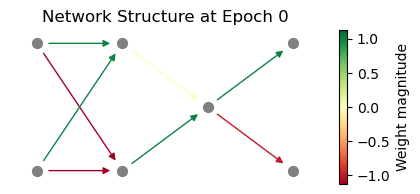

Epoch 2/5 | E=0.32 C=0.56256 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 13.54epoch/s]

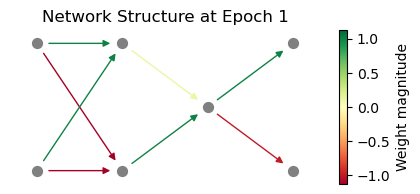

Epoch 3/5 | E=0.30 C=0.56254 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 23.99epoch/s]

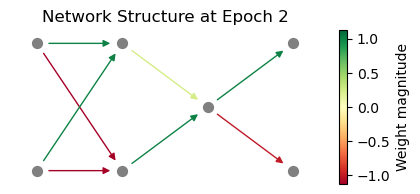

Epoch 4/5 | E=0.35 C=0.56268 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 23.99epoch/s]

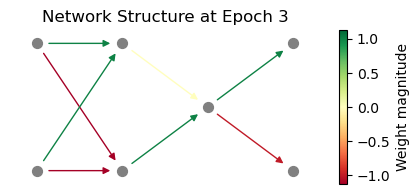

Epoch 5/5 | E=0.32 C=0.56256 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 23.99epoch/s]

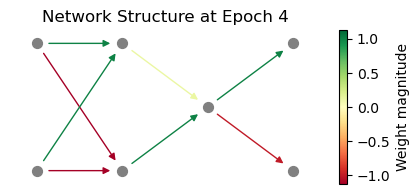

Epoch 5/5 | E=0.32 C=0.56256 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 12.20epoch/s]


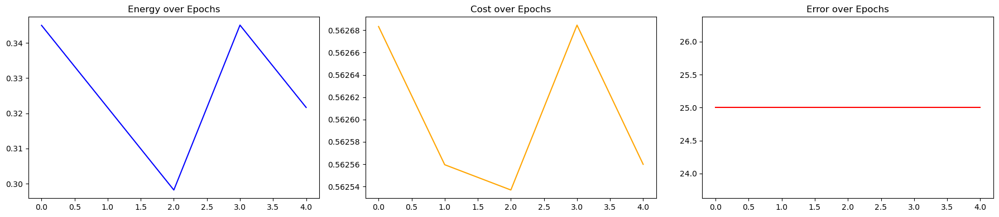

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.1250,  1.0000],
        [-1.1250,  1.0000]]), tensor([[1.0000],
        [0.1178]]), tensor([[-1.,  1.]])]
tensor([-1.,  1., -1.,  1.,  1.,  1.])


Epoch 1/5 | E=0.29 C=0.56253 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

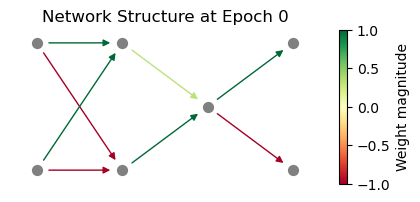

Epoch 2/5 | E=0.33 C=0.56257 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 16.69epoch/s]

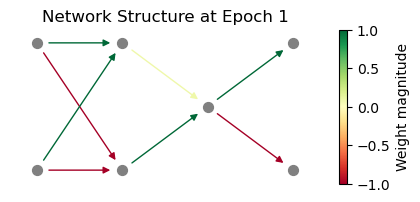

Epoch 3/5 | E=0.30 C=0.56254 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 20.44epoch/s]

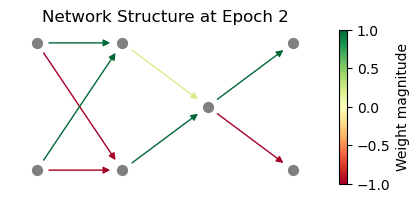

Epoch 4/5 | E=0.35 C=0.56299 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 20.44epoch/s]

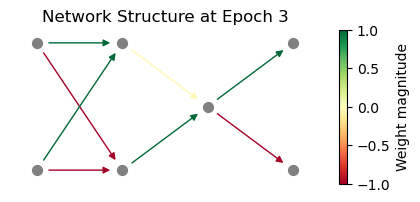

Epoch 5/5 | E=0.33 C=0.56257 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 20.44epoch/s]

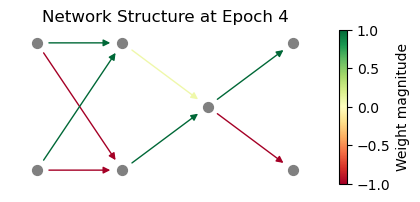

Epoch 5/5 | E=0.33 C=0.56257 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.80epoch/s]


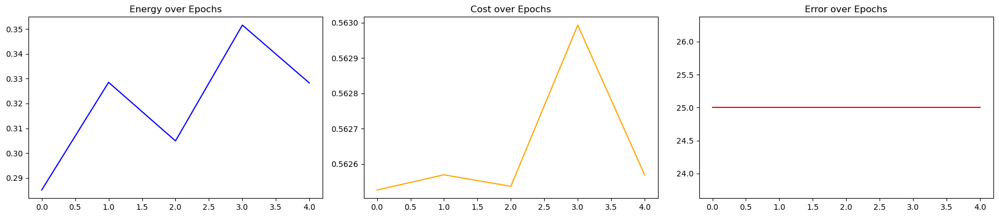

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[-1.0000,  1.0000],
        [-1.0000,  1.0000]]), tensor([[1.0000],
        [0.0825]]), tensor([[-1.,  1.]])]
tensor([-1.,  1.,  1., -1., -1., -1.])


Epoch 1/5 | E=0.14 C=0.25005 Error=0.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

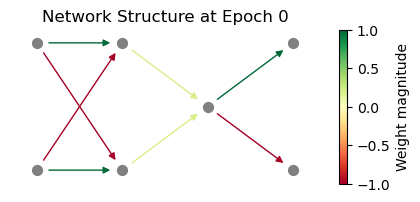

Epoch 2/5 | E=0.14 C=0.25005 Error=0.00%:  20%|██        | 1/5 [00:00<00:00, 18.10epoch/s]

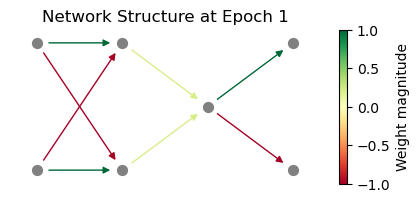

Epoch 3/5 | E=0.14 C=0.25005 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 21.07epoch/s]

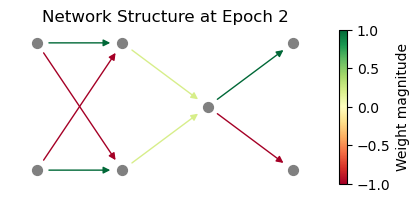

Epoch 4/5 | E=0.14 C=0.25005 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 21.07epoch/s]

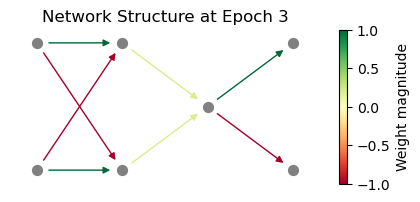

Epoch 5/5 | E=0.14 C=0.25005 Error=0.00%:  80%|████████  | 4/5 [00:00<00:00, 21.07epoch/s]

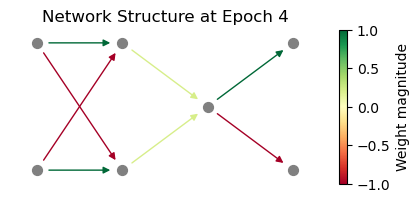

Epoch 5/5 | E=0.14 C=0.25005 Error=0.00%: 100%|██████████| 5/5 [00:00<00:00, 13.32epoch/s]


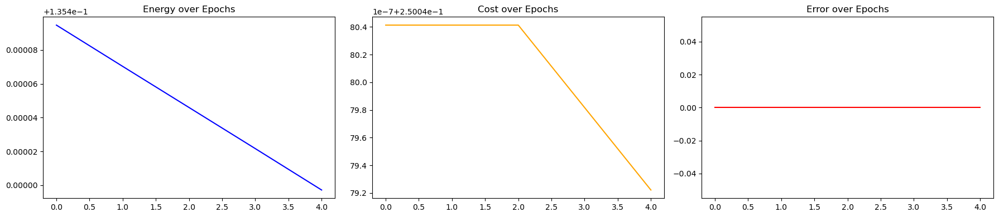

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0000,  1.0000],
        [ 1.0000, -1.0000]]), tensor([[0.2084],
        [0.2084]]), tensor([[-1.,  1.]])]
tensor([-1.,  1.,  1., -1., -1.,  1.])


Epoch 1/5 | E=-0.05 C=0.58167 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

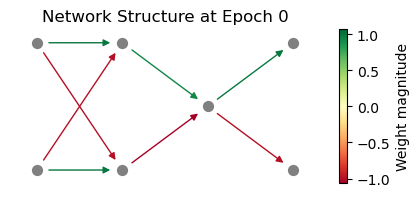

Epoch 2/5 | E=-0.06 C=0.57212 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 14.73epoch/s]

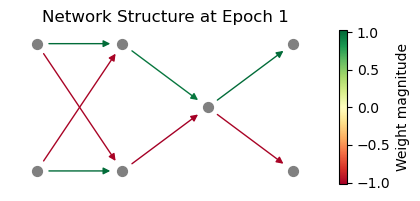

Epoch 3/5 | E=-0.05 C=0.56469 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.28epoch/s]

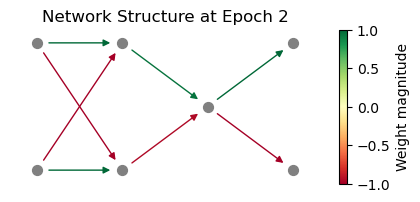

Epoch 4/5 | E=-0.02 C=0.56250 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.28epoch/s]

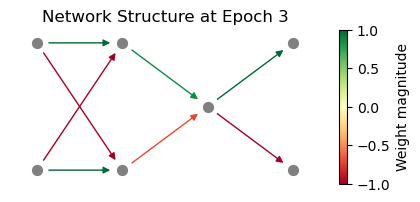

Epoch 5/5 | E=0.11 C=0.56251 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 21.28epoch/s] 

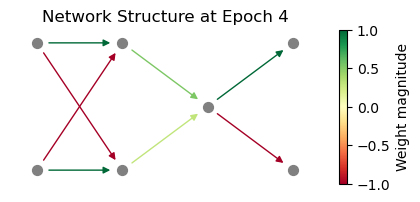

Epoch 5/5 | E=0.11 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 12.02epoch/s]


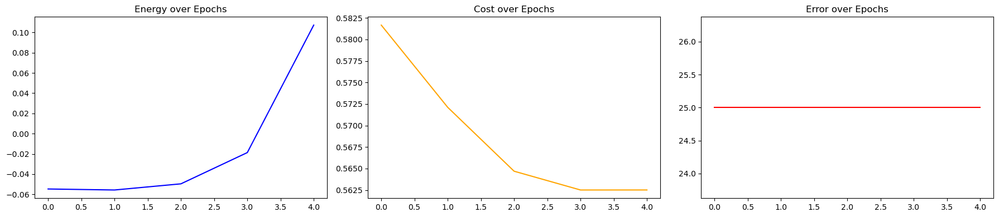

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0000,  1.0000],
        [ 1.0000, -1.0000]]), tensor([[0.2926],
        [0.5255]]), tensor([[-1.,  1.]])]
tensor([-1.,  1.,  1., -1.,  1., -1.])


Epoch 1/5 | E=-0.06 C=0.57238 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

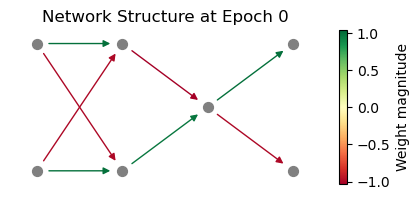

Epoch 2/5 | E=-0.06 C=0.56704 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 15.09epoch/s]

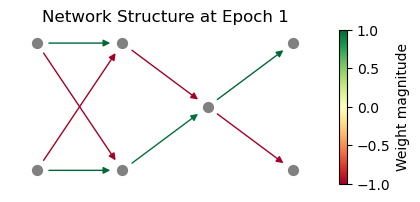

Epoch 3/5 | E=-0.05 C=0.56250 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.12epoch/s]

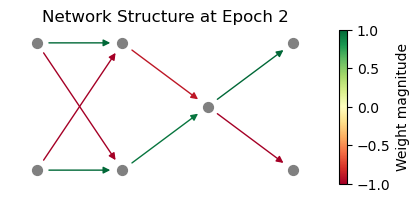

Epoch 4/5 | E=0.00 C=0.56250 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.12epoch/s] 

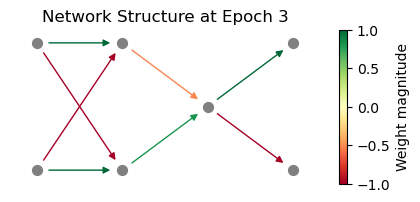

Epoch 5/5 | E=0.07 C=0.25029 Error=0.00%:  80%|████████  | 4/5 [00:00<00:00, 21.12epoch/s] 

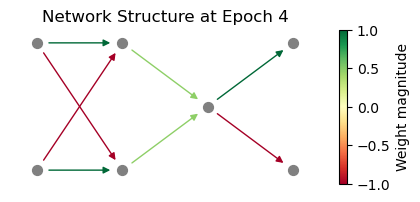

Epoch 5/5 | E=0.07 C=0.25029 Error=0.00%: 100%|██████████| 5/5 [00:00<00:00, 14.14epoch/s]


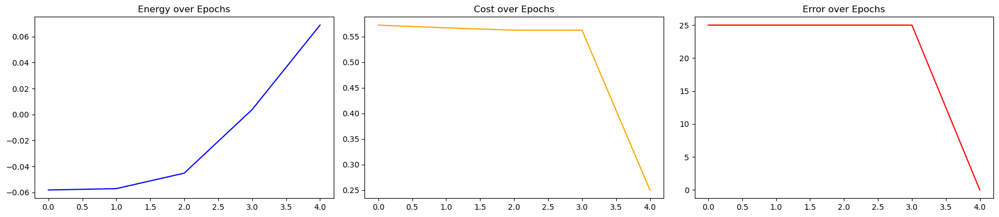

[tensor([0., 0.]), tensor([0., -0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0000,  1.0000],
        [ 1.0000, -1.0000]]), tensor([[0.4749],
        [0.4749]]), tensor([[-1.,  1.]])]
tensor([-1.,  1.,  1., -1.,  1.,  1.])


Epoch 1/5 | E=-0.06 C=0.25001 Error=0.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

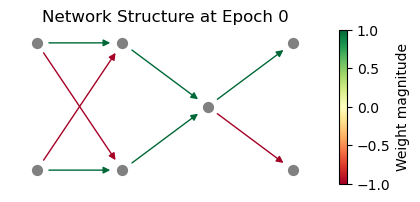

Epoch 2/5 | E=-0.06 C=0.25001 Error=0.00%:  20%|██        | 1/5 [00:00<00:00, 12.06epoch/s]

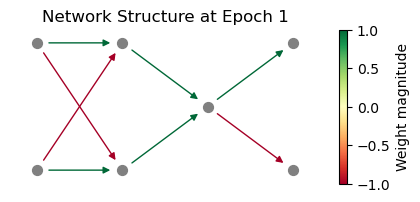

Epoch 3/5 | E=-0.06 C=0.25001 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 17.51epoch/s]

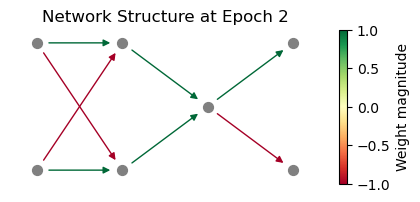

Epoch 4/5 | E=-0.06 C=0.25001 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 17.51epoch/s]

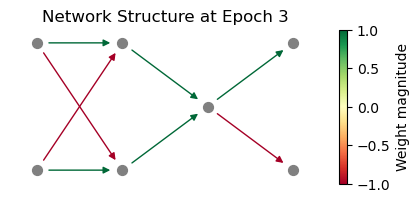

Epoch 5/5 | E=-0.06 C=0.25001 Error=0.00%: 100%|██████████| 5/5 [00:00<00:00, 15.39epoch/s]

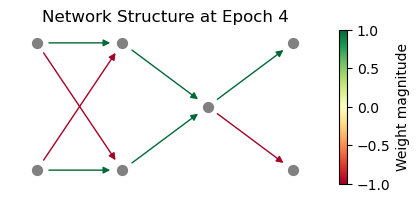

Epoch 5/5 | E=-0.06 C=0.25001 Error=0.00%: 100%|██████████| 5/5 [00:00<00:00, 13.46epoch/s]


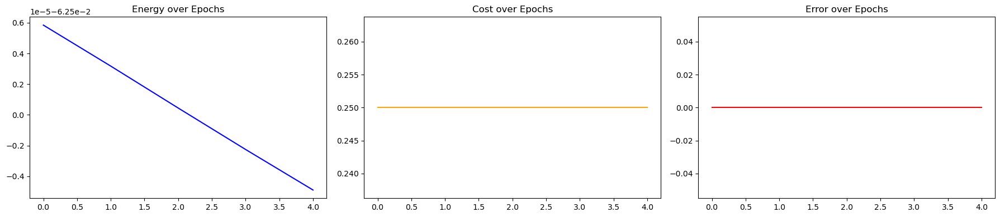

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.,  1.],
        [ 1., -1.]]), tensor([[1.0001],
        [1.0001]]), tensor([[-1.,  1.]])]
tensor([-1.,  1.,  1.,  1., -1., -1.])


Epoch 1/5 | E=0.14 C=0.88350 Error=50.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

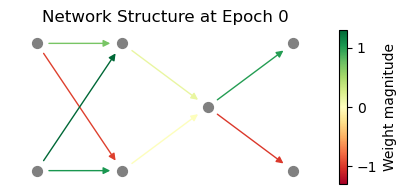

Epoch 2/5 | E=0.14 C=0.56252 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 15.05epoch/s]

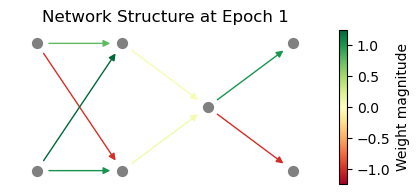

Epoch 3/5 | E=0.17 C=0.88021 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 21.36epoch/s]

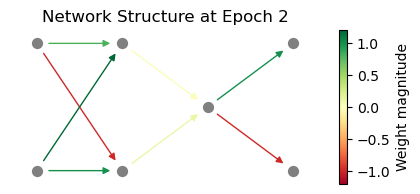

Epoch 4/5 | E=0.17 C=0.56254 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.36epoch/s]

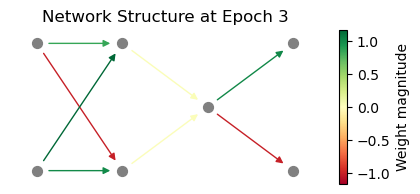

Epoch 5/5 | E=0.17 C=0.63390 Error=50.00%:  80%|████████  | 4/5 [00:00<00:00, 21.36epoch/s]

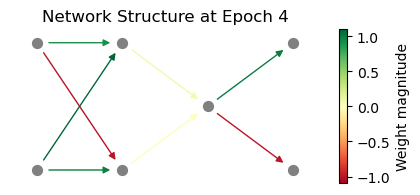

Epoch 5/5 | E=0.17 C=0.63390 Error=50.00%: 100%|██████████| 5/5 [00:00<00:00, 12.02epoch/s]


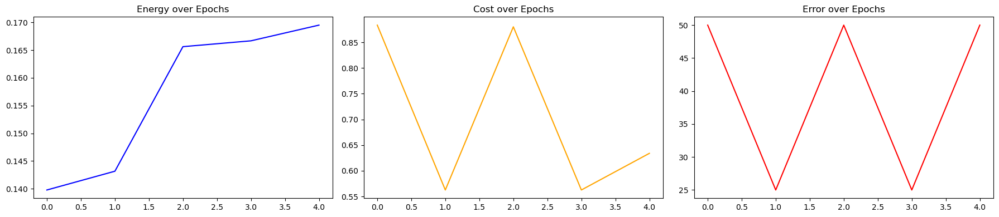

[tensor([0., 0.]), tensor([0., -0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0086,  0.9022],
        [ 0.9914,  1.0978]]), tensor([[0.0098],
        [0.0699]]), tensor([[-1.,  1.]])]
tensor([-1.,  1.,  1.,  1., -1.,  1.])


Epoch 1/5 | E=0.07 C=0.60560 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

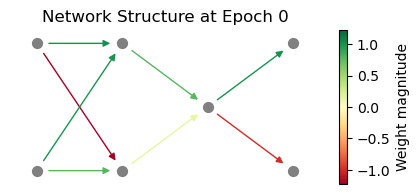

Epoch 2/5 | E=0.07 C=0.62445 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 11.40epoch/s]

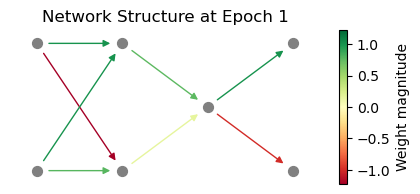

Epoch 3/5 | E=0.07 C=0.62411 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 17.44epoch/s]

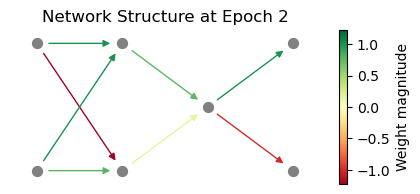

Epoch 4/5 | E=0.07 C=0.62392 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 17.44epoch/s]

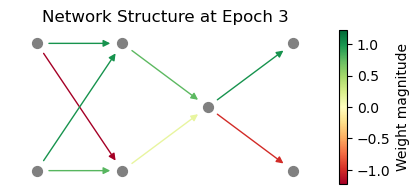

Epoch 5/5 | E=0.07 C=0.62386 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 15.83epoch/s]

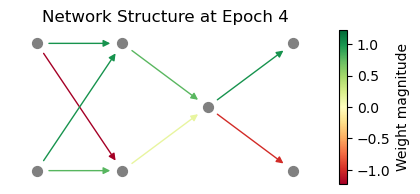

Epoch 5/5 | E=0.07 C=0.62386 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.68epoch/s]


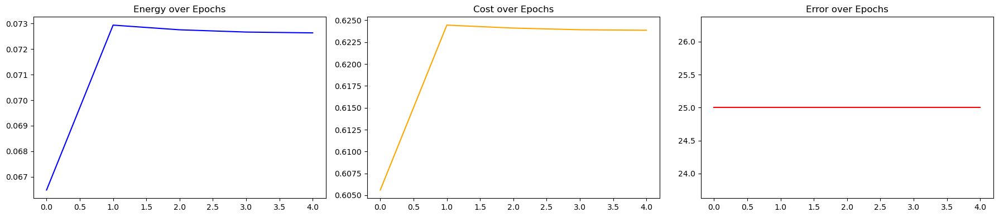

[tensor([0., 0.]), tensor([-0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.2235,  1.0001],
        [ 0.7765,  0.9999]]), tensor([[0.1515],
        [0.7647]]), tensor([[-1.,  1.]])]
tensor([-1.,  1.,  1.,  1.,  1., -1.])


Epoch 1/5 | E=0.01 C=0.56250 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

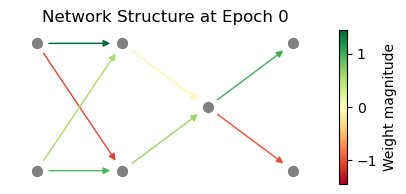

Epoch 2/5 | E=0.09 C=0.61097 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.44epoch/s]

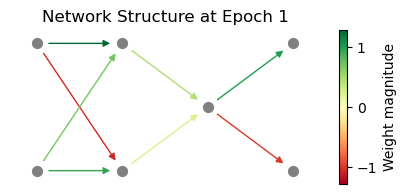

Epoch 3/5 | E=0.10 C=0.61314 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.01epoch/s]

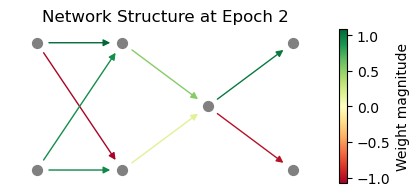

Epoch 4/5 | E=0.10 C=0.62063 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.01epoch/s]

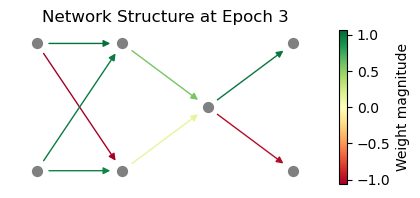

Epoch 5/5 | E=0.10 C=0.62391 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 22.01epoch/s]

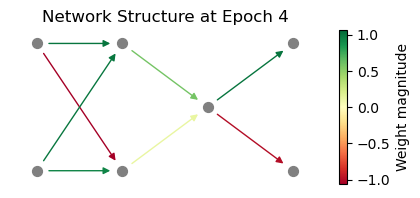

Epoch 5/5 | E=0.10 C=0.62391 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.59epoch/s]


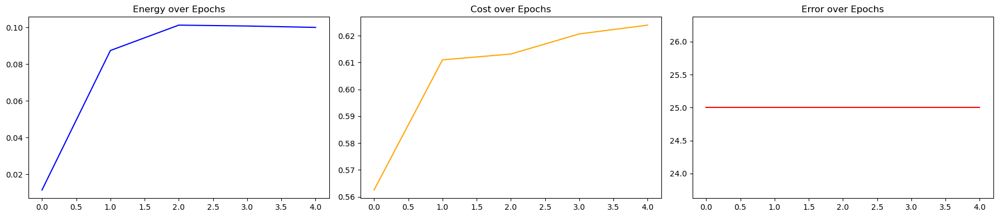

[tensor([0., 0.]), tensor([-0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0632,  1.0009],
        [ 0.9368,  0.9919]]), tensor([[0.1237],
        [0.5864]]), tensor([[-1.,  1.]])]
tensor([-1.,  1.,  1.,  1.,  1.,  1.])


Epoch 1/5 | E=-0.00 C=0.59894 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

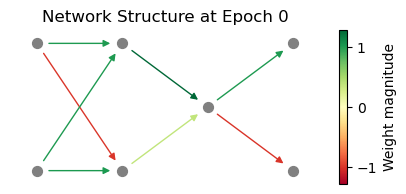

Epoch 2/5 | E=-0.01 C=0.62144 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 16.51epoch/s]

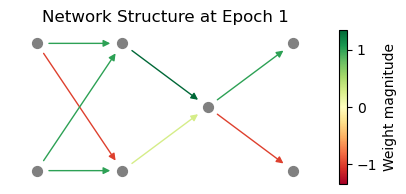

Epoch 3/5 | E=-0.02 C=0.62395 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 14.03epoch/s]

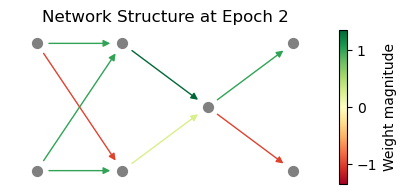

Epoch 4/5 | E=-0.02 C=0.62293 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 14.03epoch/s]

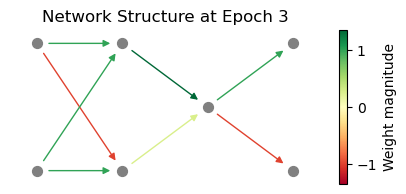

Epoch 5/5 | E=-0.02 C=0.62265 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.65epoch/s]

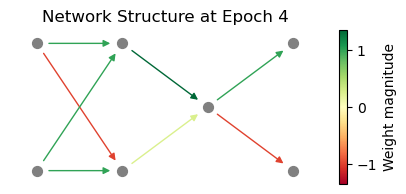

Epoch 5/5 | E=-0.02 C=0.62265 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 12.75epoch/s]


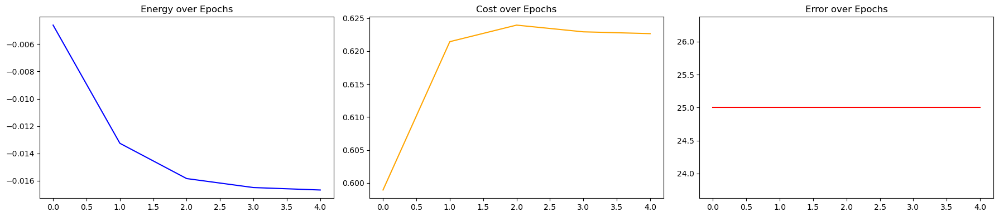

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-1.0002,  1.0001],
        [ 0.9998,  0.9999]]), tensor([[0.2651],
        [1.3581]]), tensor([[-1.,  1.]])]
tensor([ 1., -1., -1., -1., -1., -1.])


Epoch 1/5 | E=0.32 C=0.56252 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

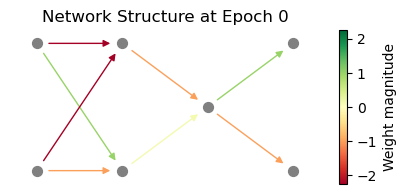

Epoch 2/5 | E=0.39 C=1.06231 Error=75.00%:  20%|██        | 1/5 [00:00<00:00, 16.34epoch/s]

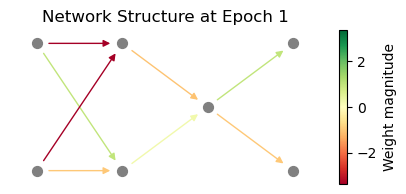

Epoch 3/5 | E=0.34 C=0.56254 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.75epoch/s]

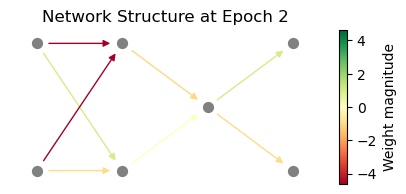

Epoch 4/5 | E=0.32 C=0.56252 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.75epoch/s]

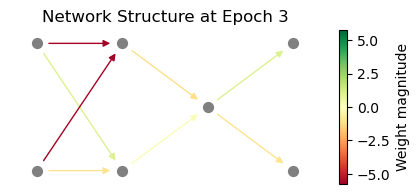

Epoch 5/5 | E=0.40 C=1.06219 Error=75.00%:  80%|████████  | 4/5 [00:00<00:00, 22.75epoch/s]

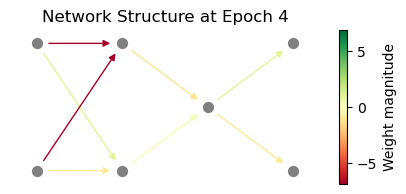

Epoch 5/5 | E=0.40 C=1.06219 Error=75.00%: 100%|██████████| 5/5 [00:00<00:00, 15.05epoch/s]


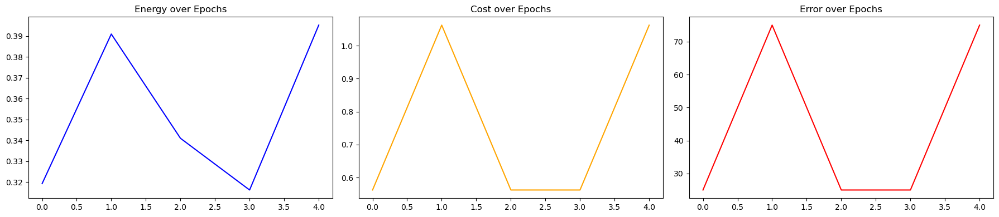

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -6.8749],
        [-1.0000, -6.8749]]), tensor([[ 0.2751],
        [-1.1860]]), tensor([[-1.,  1.]])]
tensor([ 1., -1., -1., -1., -1.,  1.])


Epoch 1/5 | E=0.30 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

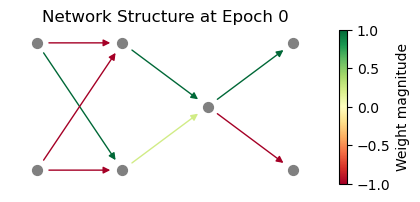

Epoch 2/5 | E=0.34 C=0.56255 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.70epoch/s]

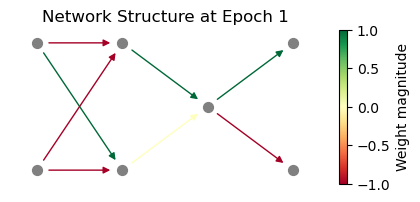

Epoch 3/5 | E=0.32 C=0.56252 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.60epoch/s]

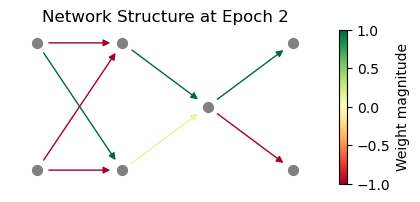

Epoch 4/5 | E=0.39 C=1.06230 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 22.60epoch/s]

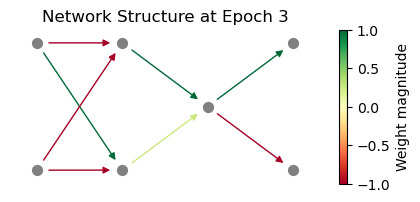

Epoch 5/5 | E=0.39 C=1.06224 Error=75.00%:  80%|████████  | 4/5 [00:00<00:00, 22.60epoch/s]

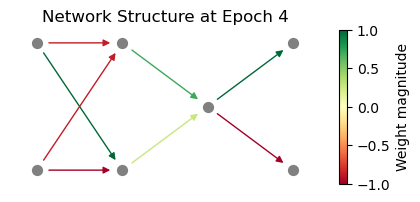

Epoch 5/5 | E=0.39 C=1.06224 Error=75.00%: 100%|██████████| 5/5 [00:00<00:00, 14.64epoch/s]


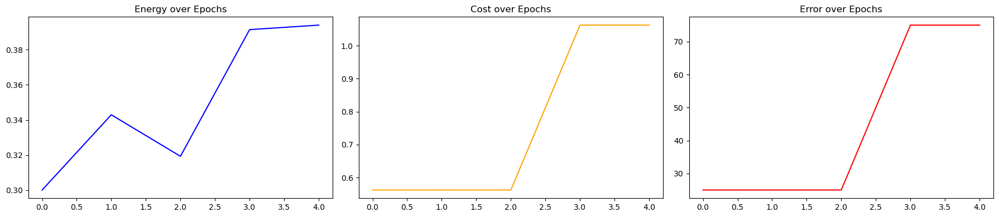

[tensor([0., 0.]), tensor([-0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -0.8750],
        [-1.0000, -0.8750]]), tensor([[0.2684],
        [0.7046]]), tensor([[-1.,  1.]])]
tensor([ 1., -1., -1., -1.,  1., -1.])


Epoch 1/5 | E=0.31 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

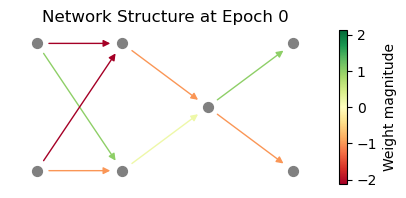

Epoch 2/5 | E=0.35 C=0.56284 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 16.52epoch/s]

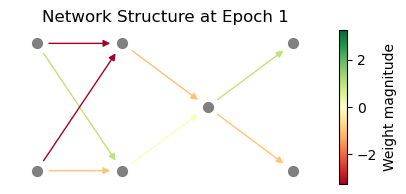

Epoch 3/5 | E=0.33 C=0.56253 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.63epoch/s]

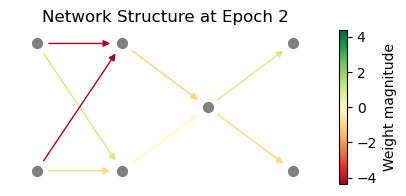

Epoch 4/5 | E=0.31 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.63epoch/s]

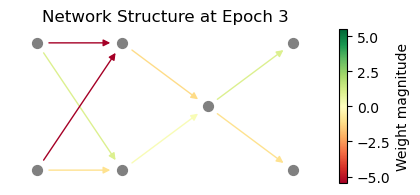

Epoch 5/5 | E=0.35 C=0.56282 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 22.63epoch/s]

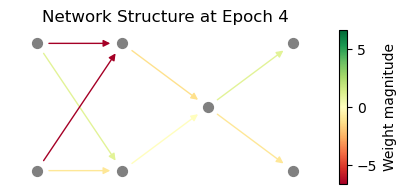

Epoch 5/5 | E=0.35 C=0.56282 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 11.75epoch/s]


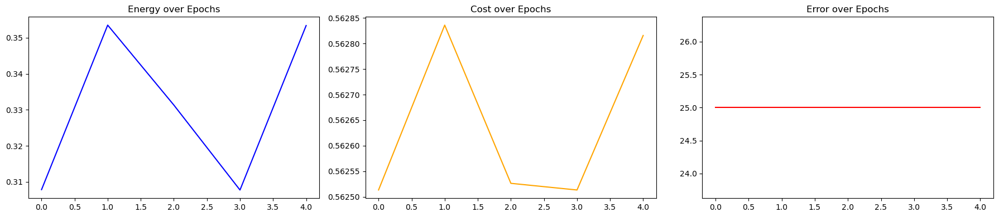

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -6.6249],
        [-1.0000, -6.6249]]), tensor([[-0.0515],
        [-1.2446]]), tensor([[-1.,  1.]])]
tensor([ 1., -1., -1., -1.,  1.,  1.])


Epoch 1/5 | E=0.24 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

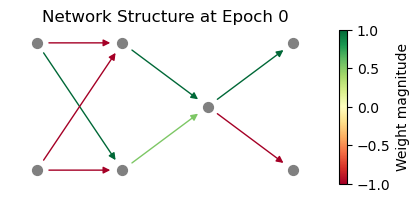

Epoch 2/5 | E=0.35 C=0.56281 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 15.88epoch/s]

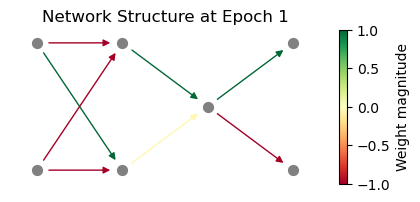

Epoch 3/5 | E=0.33 C=0.56253 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 19.69epoch/s]

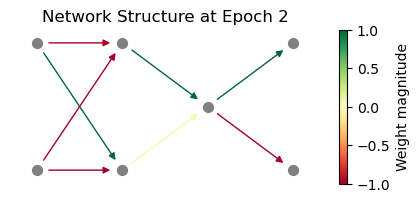

Epoch 4/5 | E=0.31 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 19.69epoch/s]

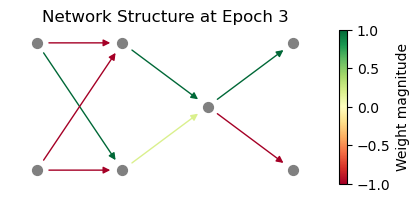

Epoch 5/5 | E=0.35 C=0.56282 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 17.03epoch/s]

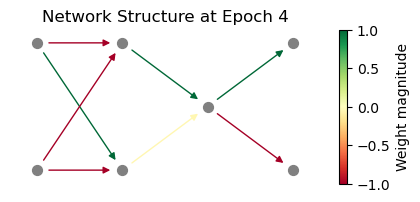

Epoch 5/5 | E=0.35 C=0.56282 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.82epoch/s]


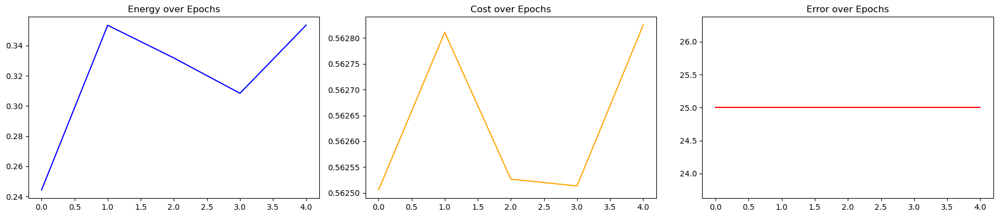

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -1.0000],
        [-1.0000, -1.0000]]), tensor([[-0.0518],
        [ 1.0000]]), tensor([[-1.,  1.]])]
tensor([ 1., -1., -1.,  1., -1., -1.])


Epoch 1/5 | E=0.16 C=0.25008 Error=0.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

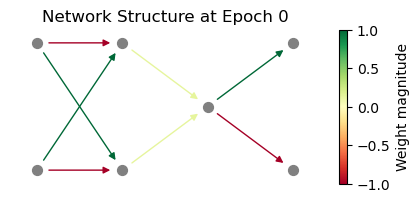

Epoch 2/5 | E=0.16 C=0.36109 Error=0.00%:  20%|██        | 1/5 [00:00<00:00, 17.06epoch/s]

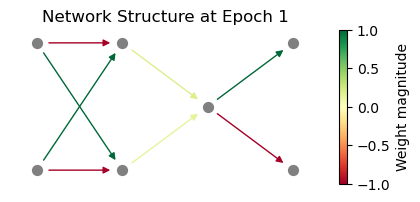

Epoch 3/5 | E=0.11 C=0.25265 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 20.27epoch/s]

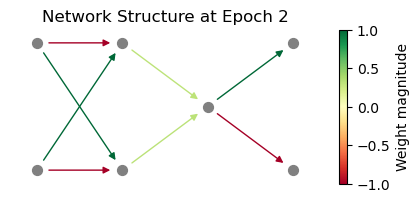

Epoch 4/5 | E=0.11 C=0.25012 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 20.27epoch/s]

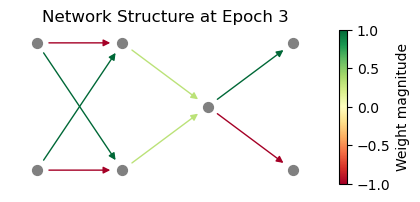

Epoch 5/5 | E=0.11 C=0.25003 Error=0.00%:  80%|████████  | 4/5 [00:00<00:00, 20.27epoch/s]

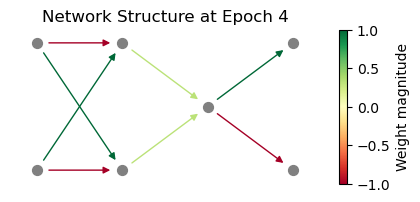

Epoch 5/5 | E=0.11 C=0.25003 Error=0.00%: 100%|██████████| 5/5 [00:00<00:00, 14.14epoch/s]


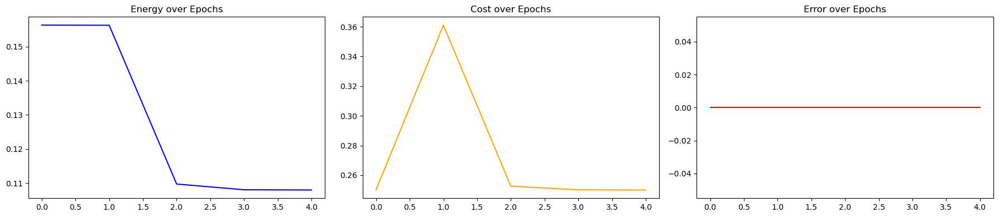

[tensor([0., 0.]), tensor([-0., -0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -1.0000],
        [-1.0000,  1.0000]]), tensor([[0.3179],
        [0.3179]]), tensor([[-1.,  1.]])]
tensor([ 1., -1., -1.,  1., -1.,  1.])


Epoch 1/5 | E=-0.06 C=0.56250 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

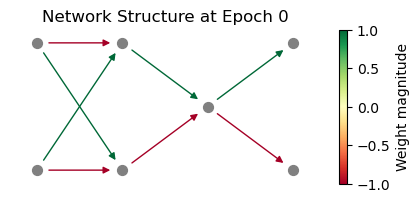

Epoch 2/5 | E=-0.05 C=0.56250 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 16.26epoch/s]

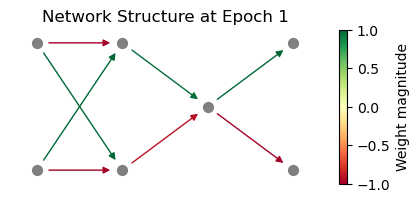

Epoch 3/5 | E=-0.02 C=0.56250 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.71epoch/s]

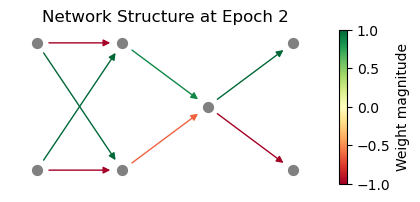

Epoch 4/5 | E=0.09 C=0.41556 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 22.71epoch/s]  

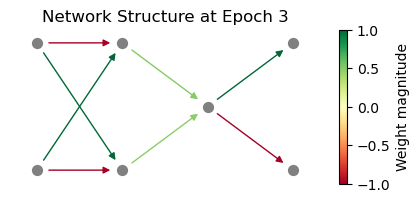

Epoch 5/5 | E=0.05 C=0.25002 Error=0.00%:  80%|████████  | 4/5 [00:00<00:00, 22.71epoch/s]

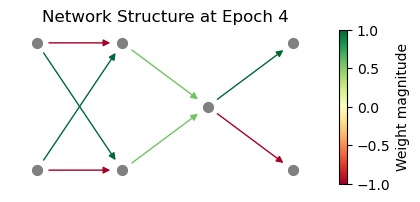

Epoch 5/5 | E=0.05 C=0.25002 Error=0.00%: 100%|██████████| 5/5 [00:00<00:00, 14.28epoch/s]


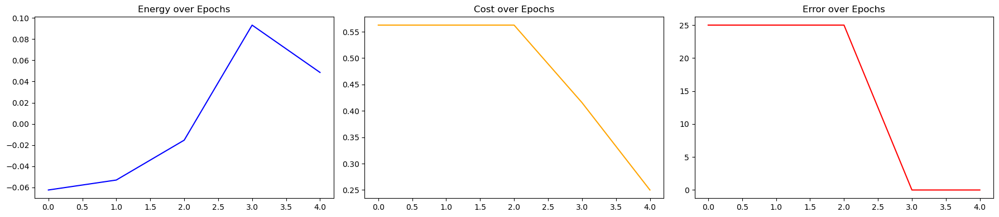

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -1.0000],
        [-1.0000,  1.0000]]), tensor([[0.5559],
        [0.5559]]), tensor([[-1.,  1.]])]
tensor([ 1., -1., -1.,  1.,  1., -1.])


Epoch 1/5 | E=-0.05 C=0.58167 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

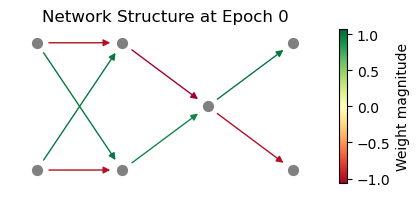

Epoch 2/5 | E=-0.06 C=0.57212 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 14.78epoch/s]

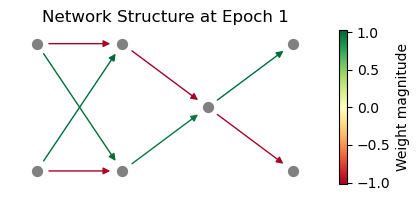

Epoch 3/5 | E=-0.05 C=0.56469 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 19.76epoch/s]

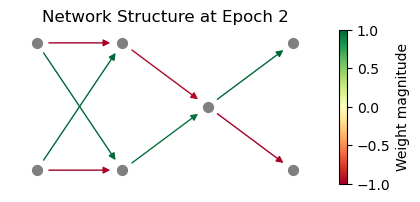

Epoch 4/5 | E=-0.02 C=0.56250 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 19.76epoch/s]

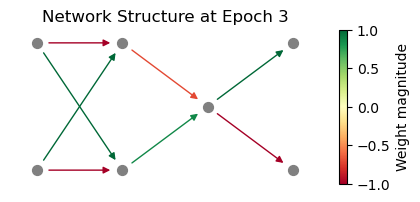

Epoch 5/5 | E=0.11 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 15.12epoch/s] 

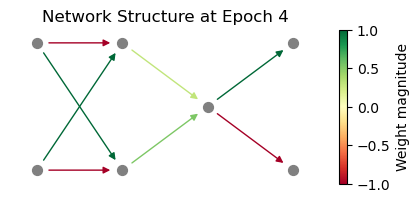

Epoch 5/5 | E=0.11 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.50epoch/s]


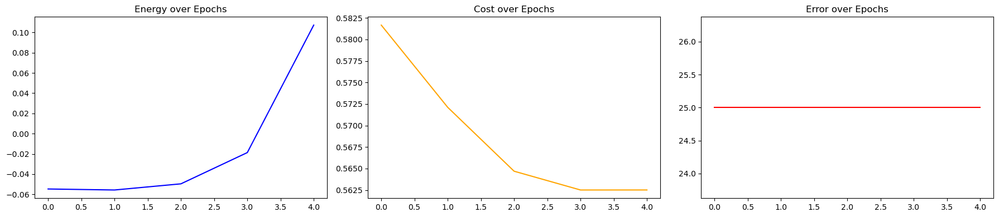

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -1.0000],
        [-1.0000,  1.0000]]), tensor([[0.5255],
        [0.2926]]), tensor([[-1.,  1.]])]
tensor([ 1., -1., -1.,  1.,  1.,  1.])


Epoch 1/5 | E=-0.03 C=0.25001 Error=0.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

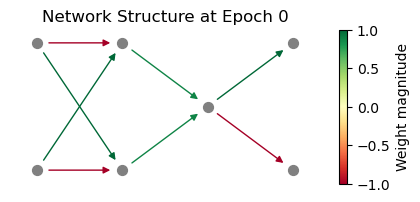

Epoch 2/5 | E=-0.03 C=0.25001 Error=0.00%:  20%|██        | 1/5 [00:00<00:00, 17.64epoch/s]

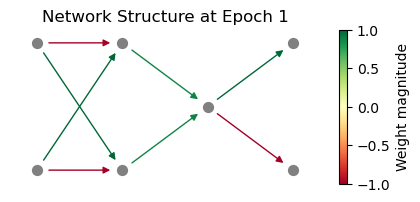

Epoch 3/5 | E=-0.03 C=0.25001 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 22.56epoch/s]

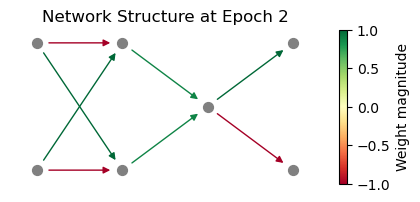

Epoch 4/5 | E=-0.03 C=0.25001 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 22.56epoch/s]

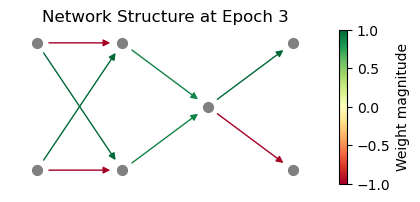

Epoch 5/5 | E=-0.03 C=0.25001 Error=0.00%:  80%|████████  | 4/5 [00:00<00:00, 22.56epoch/s]

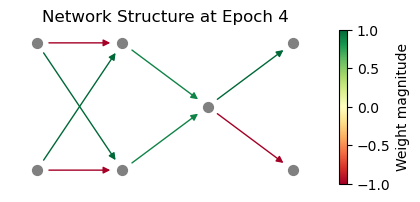

Epoch 5/5 | E=-0.03 C=0.25001 Error=0.00%: 100%|██████████| 5/5 [00:00<00:00, 15.68epoch/s]


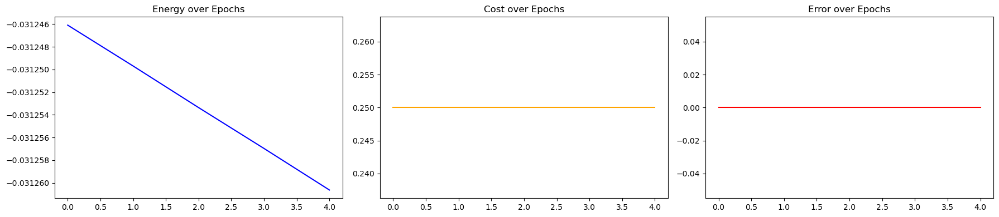

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1., -1.],
        [-1.,  1.]]), tensor([[0.8751],
        [0.8751]]), tensor([[-1.,  1.]])]
tensor([ 1., -1.,  1., -1., -1., -1.])


Epoch 1/5 | E=0.35 C=0.56294 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

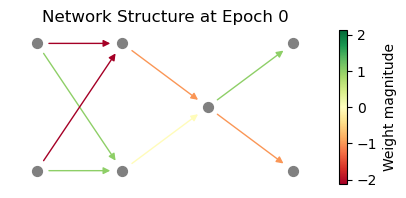

Epoch 2/5 | E=0.33 C=0.56257 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 12.33epoch/s]

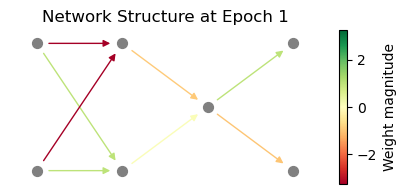

Epoch 3/5 | E=0.30 C=0.56254 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 19.24epoch/s]

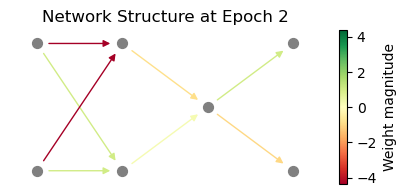

Epoch 4/5 | E=0.35 C=0.56292 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 19.24epoch/s]

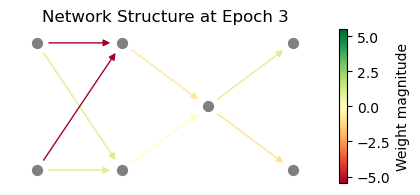

Epoch 5/5 | E=0.33 C=0.56257 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 16.91epoch/s]

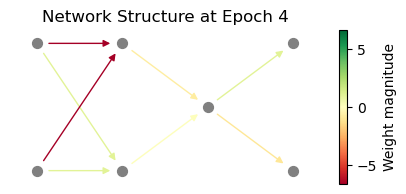

Epoch 5/5 | E=0.33 C=0.56257 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.89epoch/s]


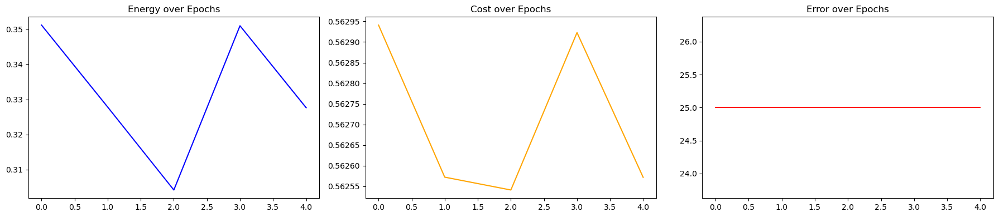

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -6.6249],
        [ 1.0000, -6.6249]]), tensor([[ 0.0860],
        [-0.7501]]), tensor([[-1.,  1.]])]
tensor([ 1., -1.,  1., -1., -1.,  1.])


Epoch 1/5 | E=0.34 C=0.56267 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

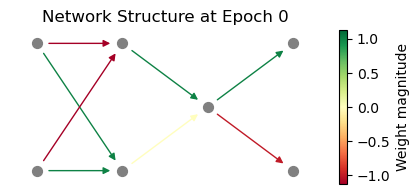

Epoch 2/5 | E=0.32 C=0.56256 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 18.02epoch/s]

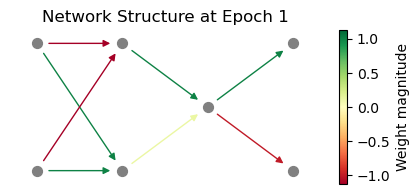

Epoch 3/5 | E=0.30 C=0.56254 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 23.68epoch/s]

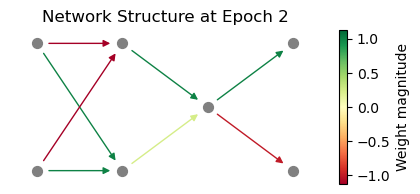

Epoch 4/5 | E=0.34 C=0.56268 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 23.68epoch/s]

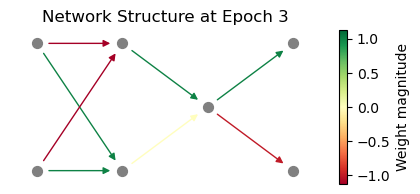

Epoch 5/5 | E=0.32 C=0.56256 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 23.68epoch/s]

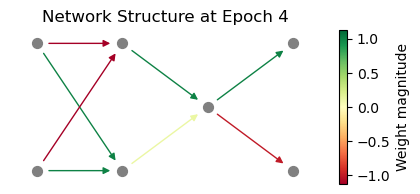

Epoch 5/5 | E=0.32 C=0.56256 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 15.58epoch/s]


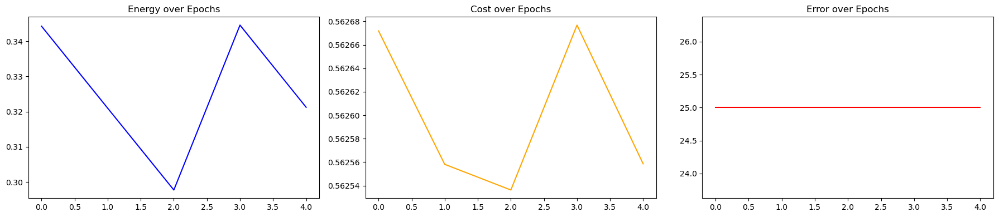

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -1.1250],
        [ 1.0000, -1.1250]]), tensor([[0.1201],
        [1.0000]]), tensor([[-1.,  1.]])]
tensor([ 1., -1.,  1., -1.,  1., -1.])


Epoch 1/5 | E=0.27 C=0.56252 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

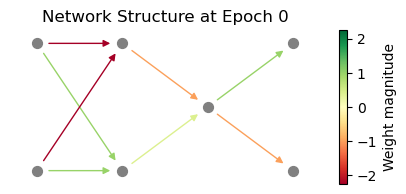

Epoch 2/5 | E=0.31 C=0.56254 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 15.19epoch/s]

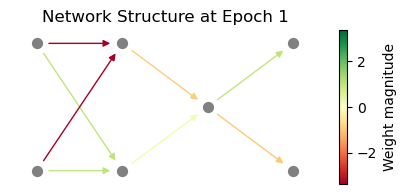

Epoch 3/5 | E=0.40 C=1.06235 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 25.56epoch/s]

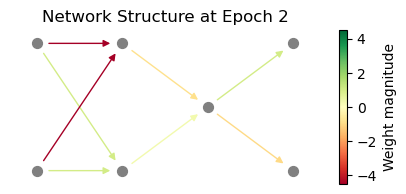

Epoch 4/5 | E=0.34 C=0.56265 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 25.56epoch/s]

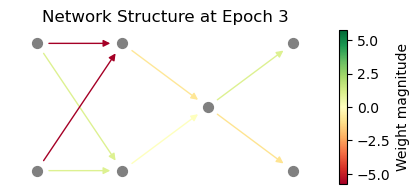

Epoch 5/5 | E=0.32 C=0.56255 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 25.56epoch/s]

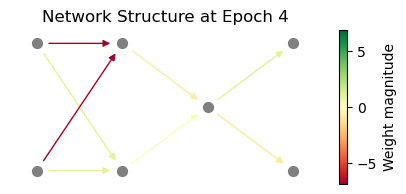

Epoch 5/5 | E=0.32 C=0.56255 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.45epoch/s]


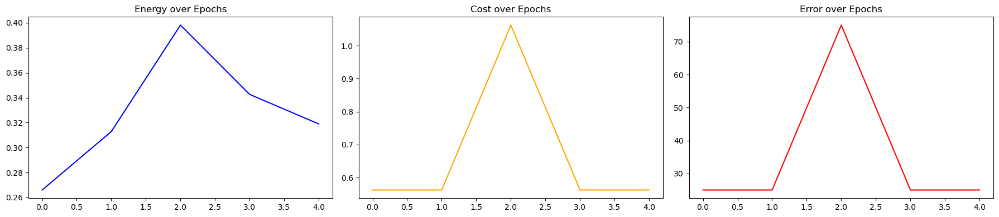

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -6.8749],
        [ 1.0000, -6.8749]]), tensor([[ 0.1323],
        [-0.8125]]), tensor([[-1.,  1.]])]
tensor([ 1., -1.,  1., -1.,  1.,  1.])


Epoch 1/5 | E=0.27 C=0.56252 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

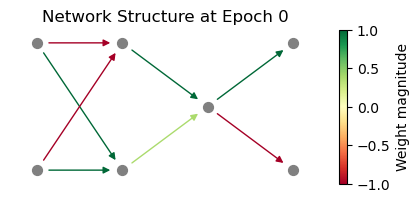

Epoch 2/5 | E=0.32 C=0.56255 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.19epoch/s]

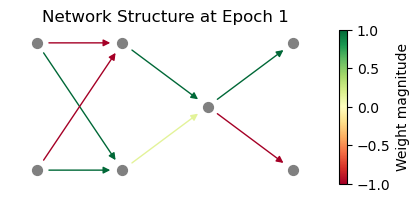

Epoch 3/5 | E=0.39 C=1.06242 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 25.86epoch/s]

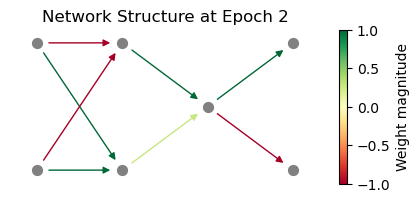

Epoch 4/5 | E=0.35 C=0.56270 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 25.86epoch/s]

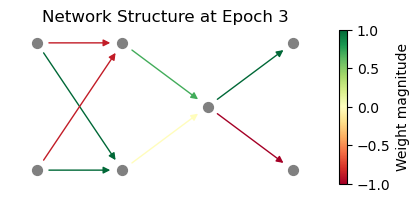

Epoch 5/5 | E=0.32 C=0.56256 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 25.86epoch/s]

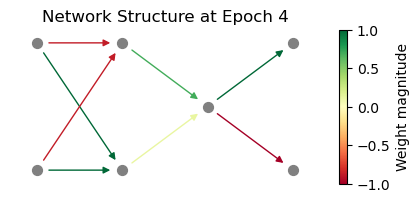

Epoch 5/5 | E=0.32 C=0.56256 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 16.15epoch/s]


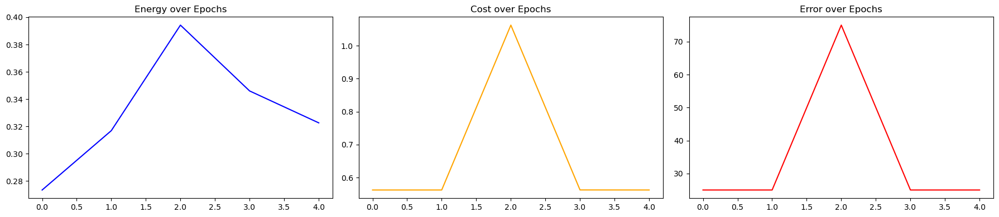

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -0.8750],
        [ 1.0000, -0.8750]]), tensor([[0.1128],
        [0.6875]]), tensor([[-1.,  1.]])]
tensor([ 1., -1.,  1.,  1., -1., -1.])


Epoch 1/5 | E=0.15 C=0.57152 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

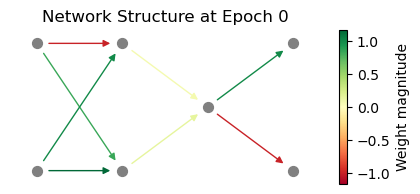

Epoch 2/5 | E=0.16 C=0.56421 Error=25.00%:  40%|████      | 2/5 [00:00<00:00, 15.64epoch/s]

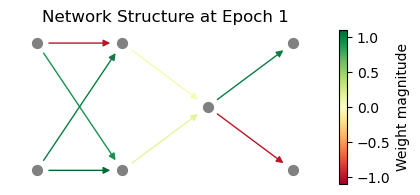

Epoch 3/5 | E=0.17 C=0.62583 Error=50.00%:  40%|████      | 2/5 [00:00<00:00, 15.64epoch/s]

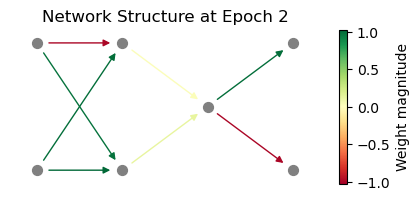

Epoch 4/5 | E=0.15 C=0.62508 Error=50.00%:  80%|████████  | 4/5 [00:00<00:00, 14.34epoch/s]

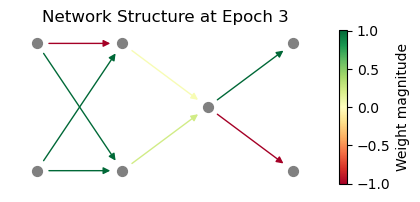

Epoch 5/5 | E=0.15 C=0.62503 Error=50.00%:  80%|████████  | 4/5 [00:00<00:00, 14.34epoch/s]

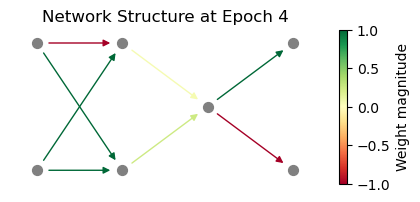

Epoch 5/5 | E=0.15 C=0.62503 Error=50.00%: 100%|██████████| 5/5 [00:00<00:00, 11.92epoch/s]


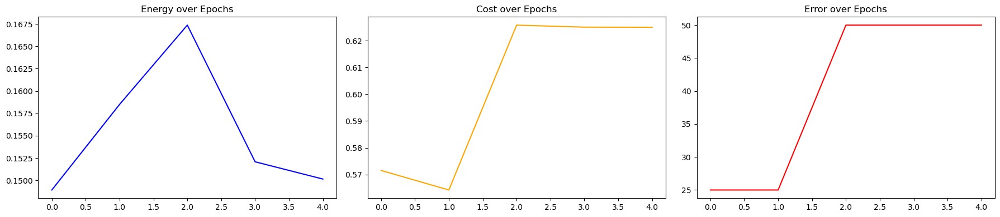

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 0.9983, -1.0002],
        [ 1.0017,  0.9998]]), tensor([[0.2484],
        [0.0494]]), tensor([[-1.,  1.]])]
tensor([ 1., -1.,  1.,  1., -1.,  1.])


Epoch 1/5 | E=-0.04 C=0.56250 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

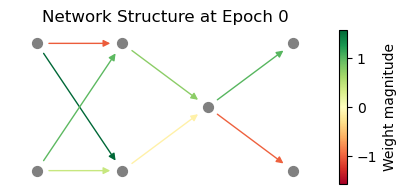

Epoch 2/5 | E=0.06 C=0.60911 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 16.50epoch/s]

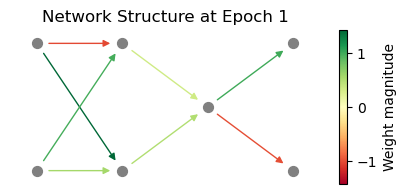

Epoch 3/5 | E=0.08 C=0.60619 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.28epoch/s]

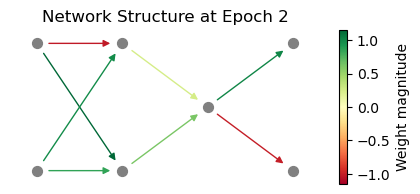

Epoch 4/5 | E=0.08 C=0.61646 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.28epoch/s]

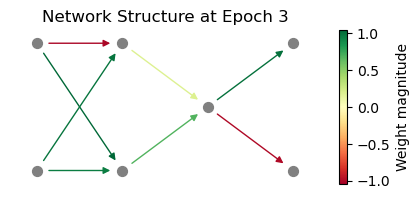

Epoch 5/5 | E=0.08 C=0.62261 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 22.28epoch/s]

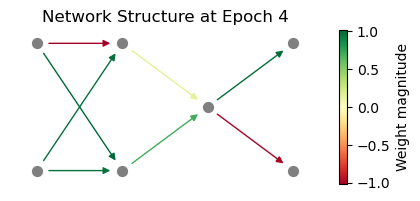

Epoch 5/5 | E=0.08 C=0.62261 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.77epoch/s]


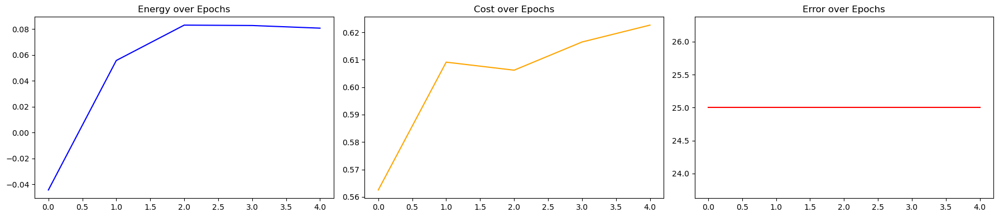

[tensor([0., 0.]), tensor([0., -0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 1.0137, -1.0193],
        [ 0.9863,  0.9807]]), tensor([[0.7076],
        [0.1556]]), tensor([[-1.,  1.]])]
tensor([ 1., -1.,  1.,  1.,  1., -1.])


Epoch 1/5 | E=0.06 C=0.60588 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

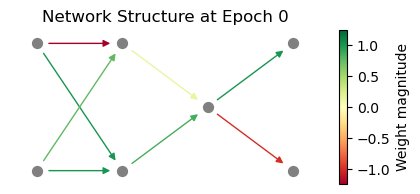

Epoch 2/5 | E=0.06 C=0.62321 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.66epoch/s]

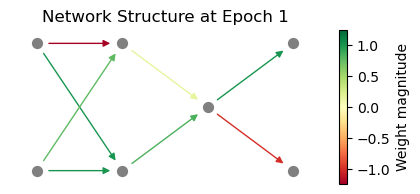

Epoch 3/5 | E=0.06 C=0.62361 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.14epoch/s]

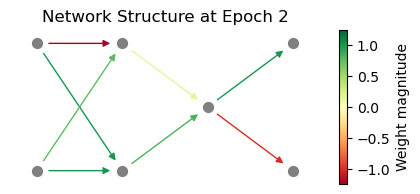

Epoch 4/5 | E=0.06 C=0.62362 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.14epoch/s]

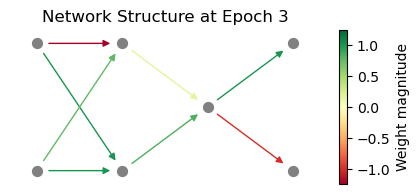

Epoch 5/5 | E=0.06 C=0.62362 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 21.14epoch/s]

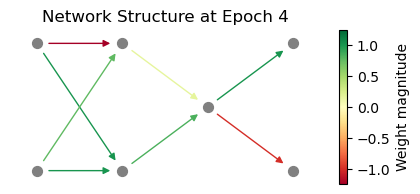

Epoch 5/5 | E=0.06 C=0.62362 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.37epoch/s]


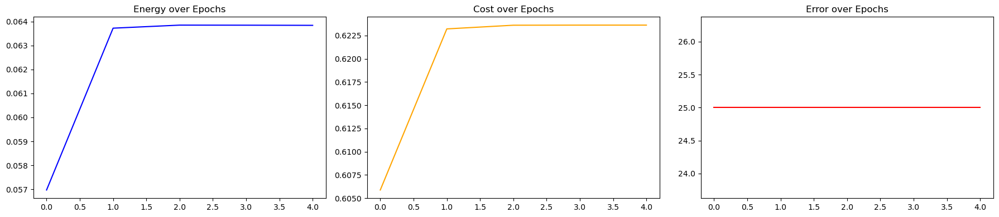

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -1.2368],
        [ 1.0000,  0.7632]]), tensor([[0.8231],
        [0.1625]]), tensor([[-1.,  1.]])]
tensor([ 1., -1.,  1.,  1.,  1.,  1.])


Epoch 1/5 | E=-0.03 C=0.58712 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

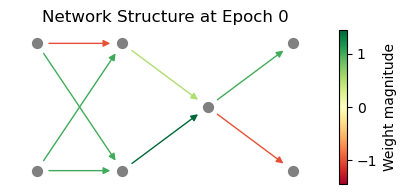

Epoch 2/5 | E=-0.04 C=0.61330 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 13.02epoch/s]

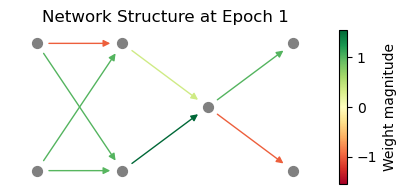

Epoch 3/5 | E=-0.05 C=0.62347 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.90epoch/s]

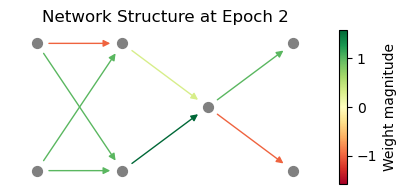

Epoch 4/5 | E=-0.05 C=0.62389 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 22.90epoch/s]

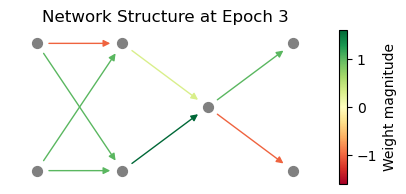

Epoch 5/5 | E=-0.05 C=0.62308 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 22.90epoch/s]

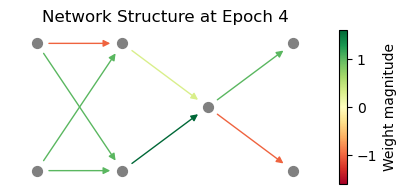

Epoch 5/5 | E=-0.05 C=0.62308 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 11.15epoch/s]


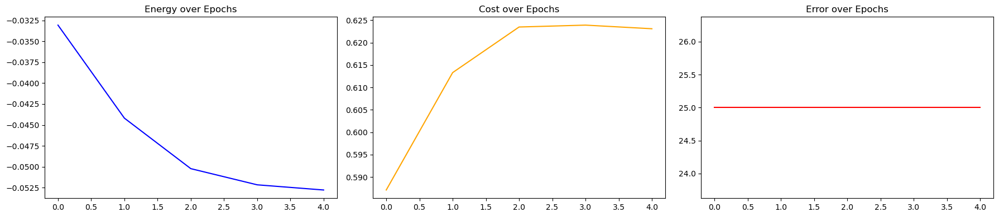

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 1.0003, -1.0001],
        [ 0.9997,  0.9999]]), tensor([[1.5990],
        [0.3136]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1., -1., -1., -1., -1.])


Epoch 1/5 | E=0.18 C=0.56252 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

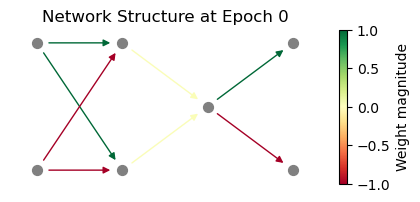

Epoch 2/5 | E=0.12 C=0.56251 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.04epoch/s]

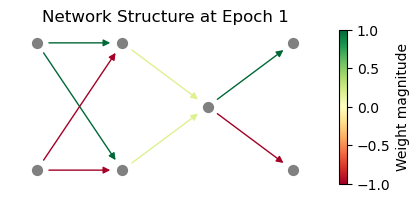

Epoch 3/5 | E=0.20 C=0.56257 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 19.92epoch/s]

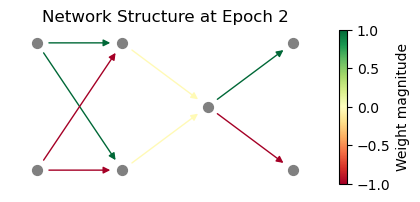

Epoch 4/5 | E=0.16 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 19.92epoch/s]

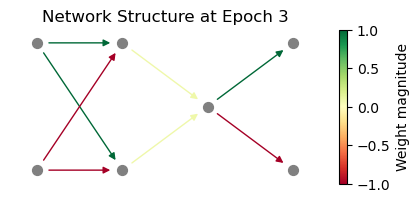

Epoch 5/5 | E=0.10 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.79epoch/s]

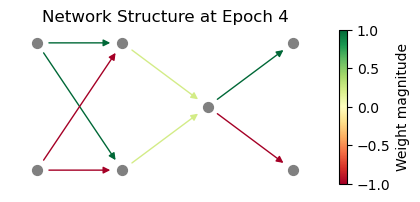

Epoch 5/5 | E=0.10 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.34epoch/s]


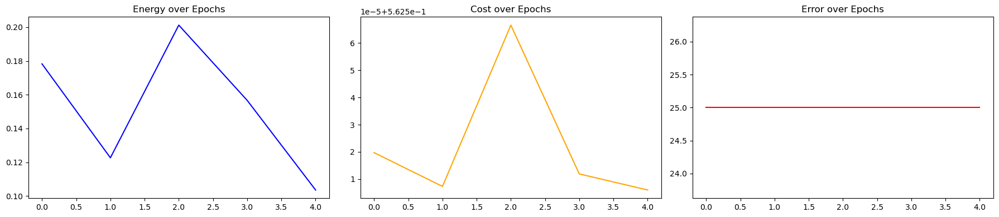

[tensor([0., 0.]), tensor([-0., -0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0000,  1.0000],
        [-1.0000, -1.0000]]), tensor([[0.2238],
        [0.2238]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1., -1., -1., -1.,  1.])


Epoch 1/5 | E=0.18 C=0.56252 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

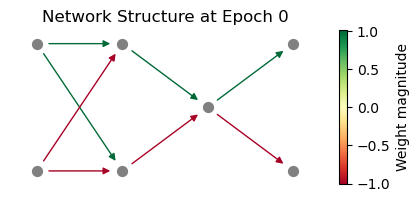

Epoch 2/5 | E=0.15 C=0.56251 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 12.71epoch/s]

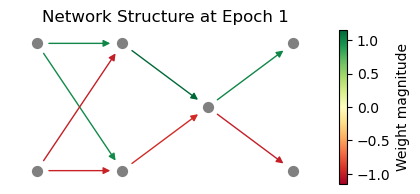

Epoch 3/5 | E=0.14 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 21.31epoch/s]

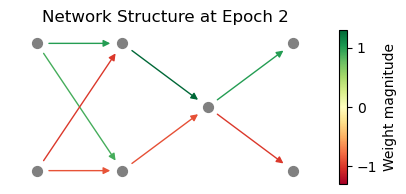

Epoch 4/5 | E=0.52 C=1.06214 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 21.31epoch/s]

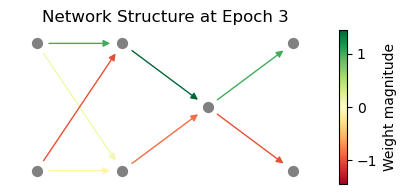

Epoch 5/5 | E=0.19 C=0.56250 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 21.31epoch/s]

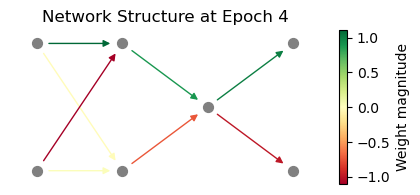

Epoch 5/5 | E=0.19 C=0.56250 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.90epoch/s]


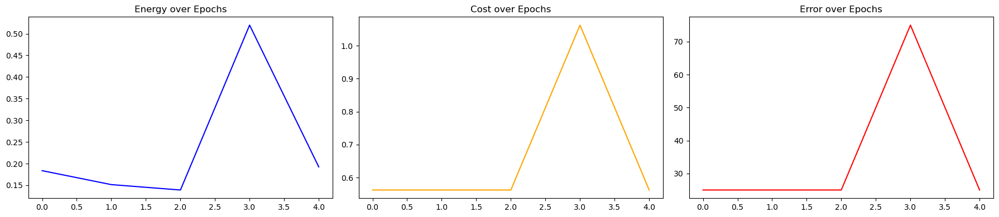

[tensor([0., 0.]), tensor([-0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-0.0184,  1.1089],
        [ 0.0183, -1.1089]]), tensor([[-0.7382],
        [ 0.8912]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1., -1., -1.,  1., -1.])


Epoch 1/5 | E=0.17 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

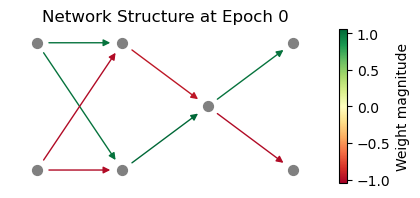

Epoch 2/5 | E=0.14 C=0.56251 Error=25.00%:  40%|████      | 2/5 [00:00<00:00, 12.77epoch/s]

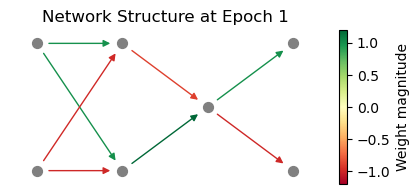

Epoch 3/5 | E=0.32 C=1.06240 Error=75.00%:  40%|████      | 2/5 [00:00<00:00, 12.77epoch/s]

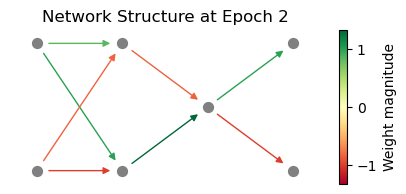

Epoch 4/5 | E=0.31 C=1.06217 Error=75.00%:  80%|████████  | 4/5 [00:00<00:00, 12.42epoch/s]

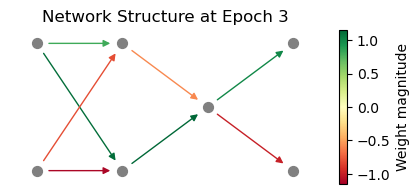

Epoch 5/5 | E=0.13 C=0.56251 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 12.42epoch/s]

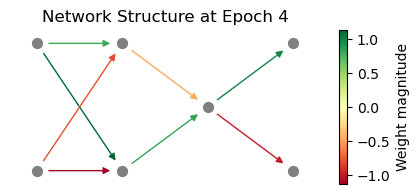

Epoch 5/5 | E=0.13 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 10.33epoch/s]


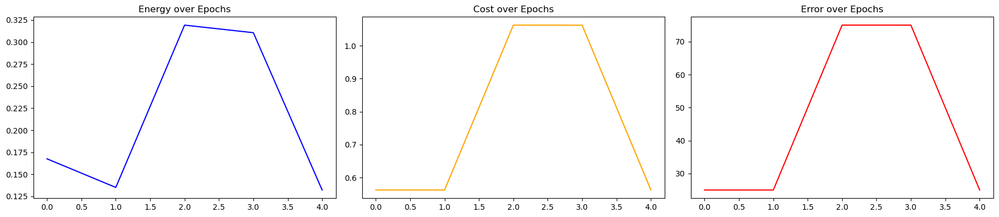

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 1.1367,  0.8065],
        [-1.1366, -0.8065]]), tensor([[ 0.8300],
        [-0.4593]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1., -1., -1.,  1.,  1.])


Epoch 1/5 | E=-0.06 C=0.56250 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

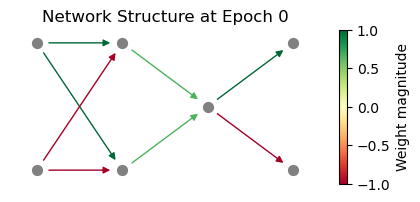

Epoch 2/5 | E=0.12 C=0.56251 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 17.33epoch/s]

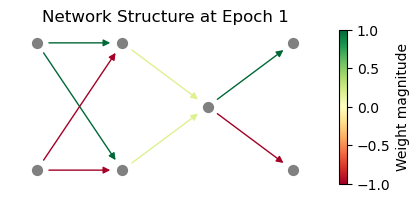

Epoch 3/5 | E=0.20 C=0.56257 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 20.86epoch/s]

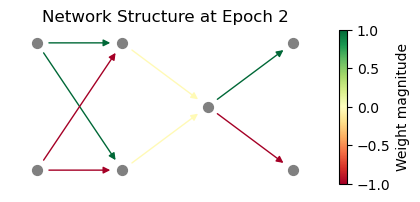

Epoch 4/5 | E=0.16 C=0.56251 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 20.86epoch/s]

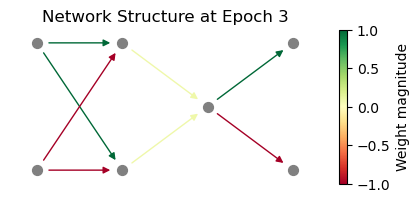

Epoch 5/5 | E=0.11 C=0.56251 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 20.86epoch/s]

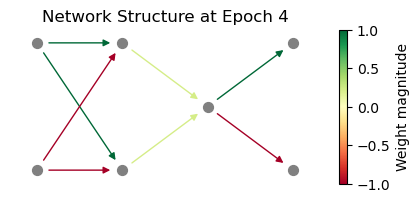

Epoch 5/5 | E=0.11 C=0.56251 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 12.55epoch/s]


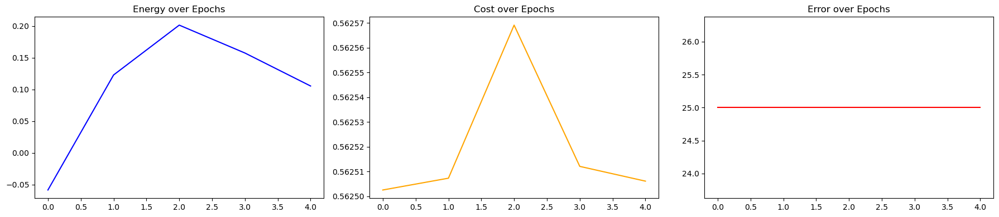

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0000,  1.0000],
        [-1.0000, -1.0000]]), tensor([[0.2186],
        [0.2186]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1., -1.,  1., -1., -1.])


Epoch 1/5 | E=0.14 C=0.85974 Error=50.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

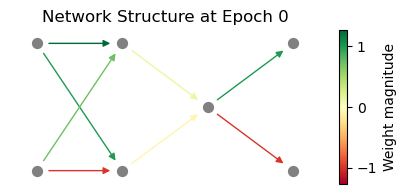

Epoch 2/5 | E=0.15 C=0.56947 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 12.77epoch/s]

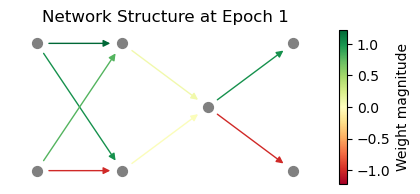

Epoch 3/5 | E=0.17 C=0.64437 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 19.88epoch/s]

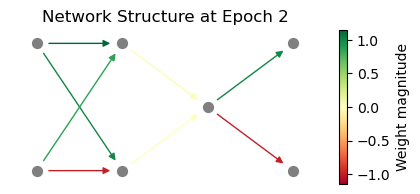

Epoch 4/5 | E=0.17 C=0.63429 Error=50.00%:  60%|██████    | 3/5 [00:00<00:00, 19.88epoch/s]

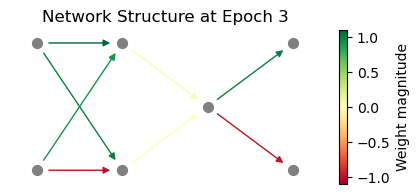

Epoch 5/5 | E=0.16 C=0.62639 Error=50.00%: 100%|██████████| 5/5 [00:00<00:00, 14.96epoch/s]

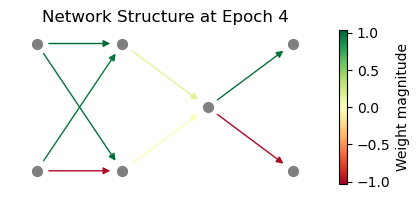

Epoch 5/5 | E=0.16 C=0.62639 Error=50.00%: 100%|██████████| 5/5 [00:00<00:00, 13.42epoch/s]


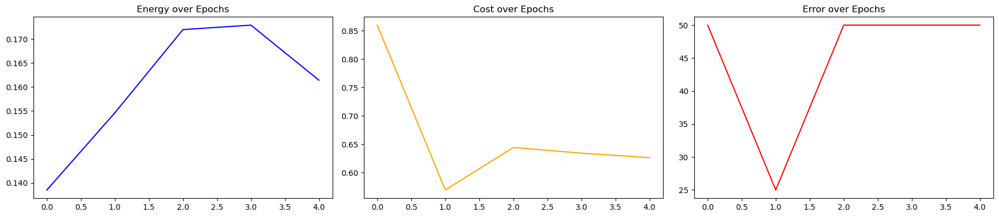

[tensor([0., 0.]), tensor([0., -0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0000,  1.0357],
        [-1.0000,  0.9643]]), tensor([[0.0286],
        [0.1580]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1., -1.,  1., -1.,  1.])


Epoch 1/5 | E=0.08 C=0.60809 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

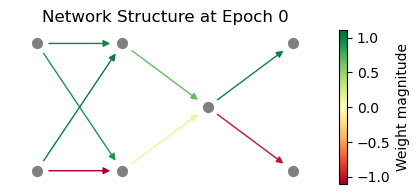

Epoch 2/5 | E=0.09 C=0.62430 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 12.54epoch/s]

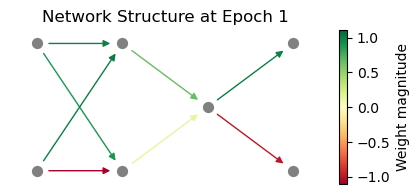

Epoch 3/5 | E=0.09 C=0.62471 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 13.56epoch/s]

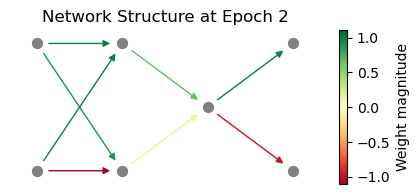

Epoch 4/5 | E=0.09 C=0.62436 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 13.56epoch/s]

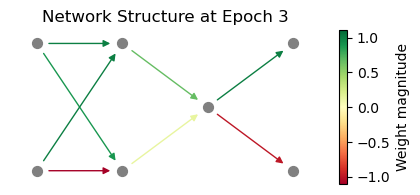

Epoch 5/5 | E=0.09 C=0.62426 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.62epoch/s]

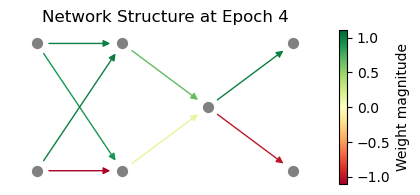

Epoch 5/5 | E=0.09 C=0.62426 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 11.92epoch/s]


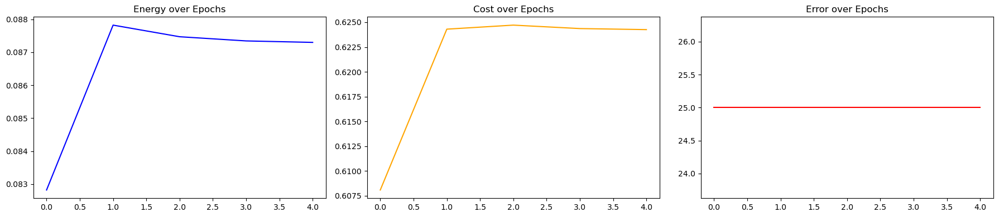

[tensor([0., 0.]), tensor([0., -0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 0.8908,  0.9998],
        [-1.1092,  1.0002]]), tensor([[0.1328],
        [0.6673]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1., -1.,  1.,  1., -1.])


Epoch 1/5 | E=-0.07 C=0.56250 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

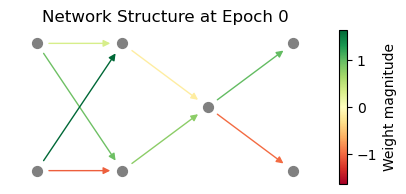

Epoch 2/5 | E=0.04 C=0.61204 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 19.58epoch/s]

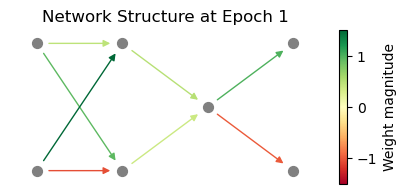

Epoch 3/5 | E=0.08 C=0.60443 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 23.69epoch/s]

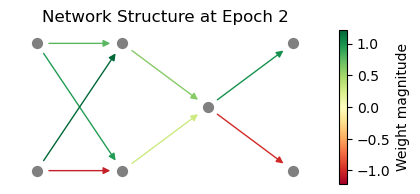

Epoch 4/5 | E=0.08 C=0.61239 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 23.69epoch/s]

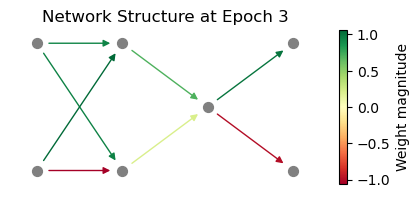

Epoch 5/5 | E=0.08 C=0.62083 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 23.69epoch/s]

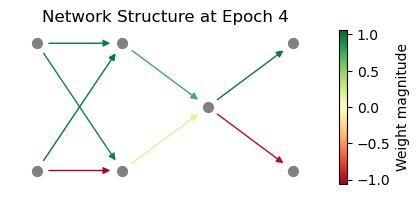

Epoch 5/5 | E=0.08 C=0.62083 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.21epoch/s]


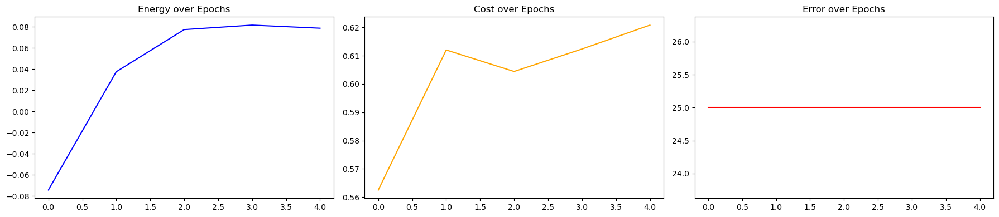

[tensor([0., 0.]), tensor([-0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 0.9398,  0.9789],
        [-1.0602,  1.0009]]), tensor([[0.1705],
        [0.7359]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1., -1.,  1.,  1.,  1.])


Epoch 1/5 | E=-0.01 C=0.58490 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

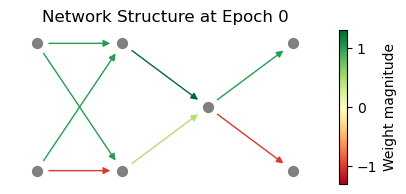

Epoch 2/5 | E=-0.02 C=0.61616 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 10.41epoch/s]

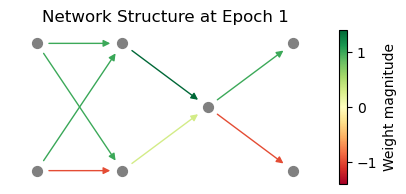

Epoch 3/5 | E=-0.03 C=0.62474 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 16.99epoch/s]

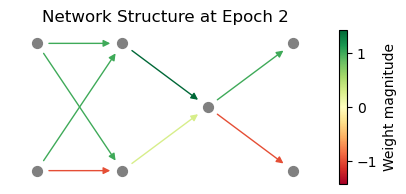

Epoch 4/5 | E=-0.03 C=0.62332 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 16.99epoch/s]

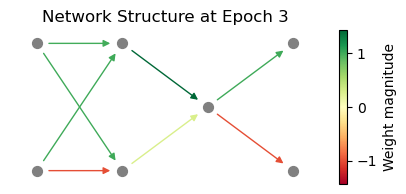

Epoch 5/5 | E=-0.03 C=0.62279 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 15.55epoch/s]

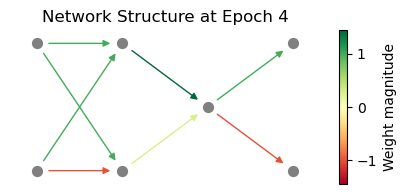

Epoch 5/5 | E=-0.03 C=0.62279 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 12.99epoch/s]


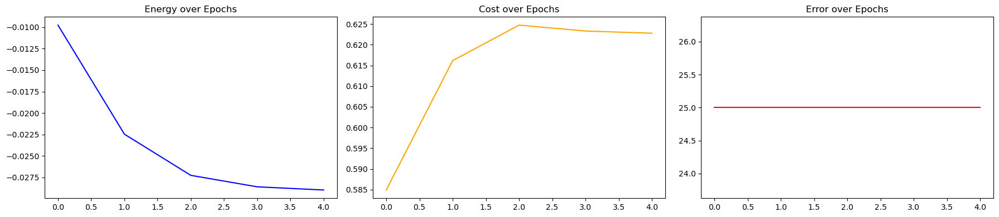

[tensor([0., 0.]), tensor([0., -0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 0.9999,  0.9998],
        [-1.0001,  1.0002]]), tensor([[0.2815],
        [1.4401]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1.,  1., -1., -1., -1.])


Epoch 1/5 | E=0.15 C=0.87712 Error=50.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

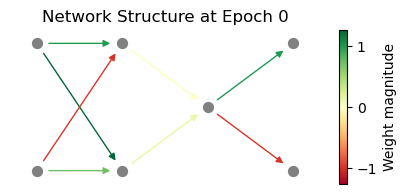

Epoch 2/5 | E=0.22 C=1.05300 Error=75.00%:  40%|████      | 2/5 [00:00<00:00, 14.06epoch/s]

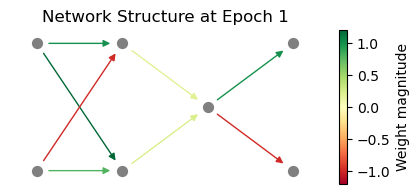

Epoch 3/5 | E=0.10 C=0.62825 Error=50.00%:  40%|████      | 2/5 [00:00<00:00, 14.06epoch/s]

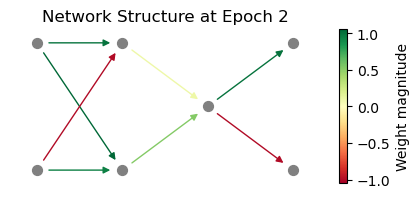

Epoch 4/5 | E=0.11 C=0.62518 Error=50.00%:  80%|████████  | 4/5 [00:00<00:00, 11.72epoch/s]

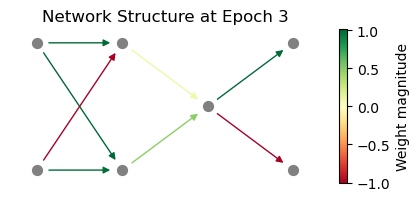

Epoch 5/5 | E=0.12 C=0.62502 Error=50.00%:  80%|████████  | 4/5 [00:00<00:00, 11.72epoch/s]

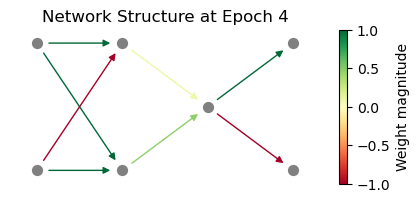

Epoch 5/5 | E=0.12 C=0.62502 Error=50.00%: 100%|██████████| 5/5 [00:00<00:00, 10.18epoch/s]


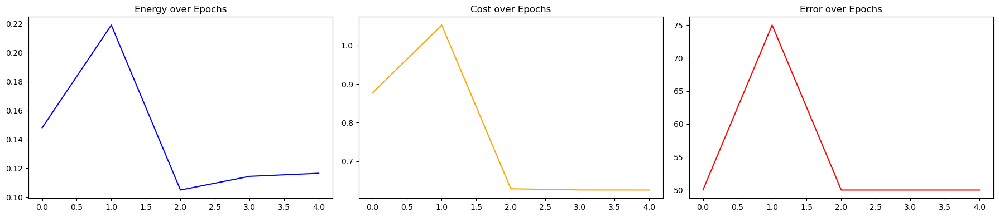

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0030,  0.9998],
        [ 0.9970, -1.0002]]), tensor([[0.4724],
        [0.0935]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1.,  1., -1., -1.,  1.])


Epoch 1/5 | E=0.03 C=0.56251 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

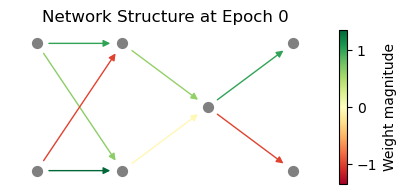

Epoch 2/5 | E=0.10 C=0.60668 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 12.28epoch/s]

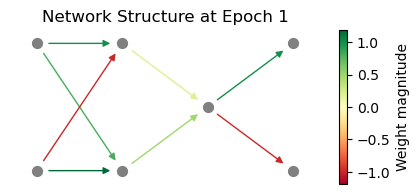

Epoch 3/5 | E=0.10 C=0.61686 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 19.59epoch/s]

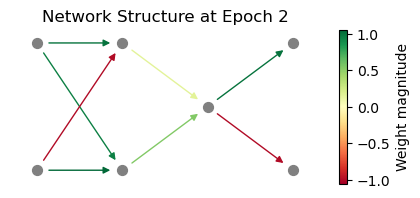

Epoch 4/5 | E=0.10 C=0.62237 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 19.59epoch/s]

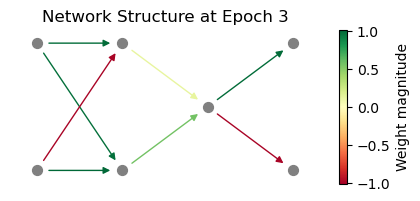

Epoch 5/5 | E=0.10 C=0.62448 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.66epoch/s]

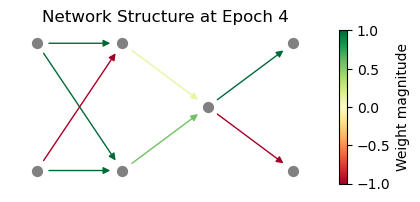

Epoch 5/5 | E=0.10 C=0.62448 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 11.94epoch/s]


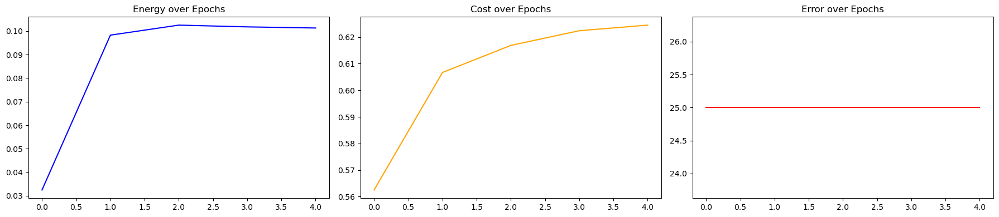

[tensor([0., 0.]), tensor([-0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 0.9949,  1.0000],
        [ 1.0051, -1.0000]]), tensor([[0.5727],
        [0.1183]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1.,  1., -1.,  1., -1.])


Epoch 1/5 | E=0.06 C=0.61026 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

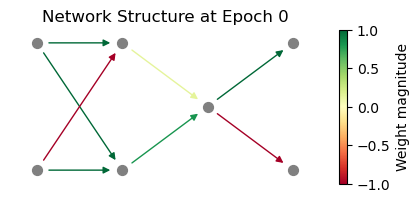

Epoch 2/5 | E=0.07 C=0.62346 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 12.07epoch/s]

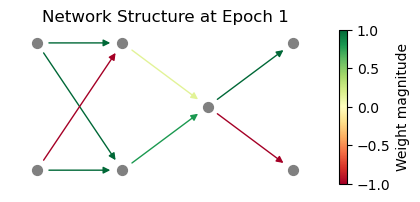

Epoch 3/5 | E=0.07 C=0.62373 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 17.06epoch/s]

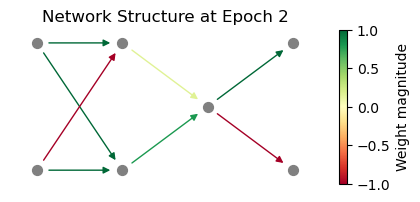

Epoch 4/5 | E=0.07 C=0.62373 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 17.06epoch/s]

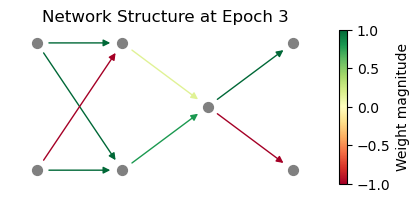

Epoch 5/5 | E=0.07 C=0.62373 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.71epoch/s]

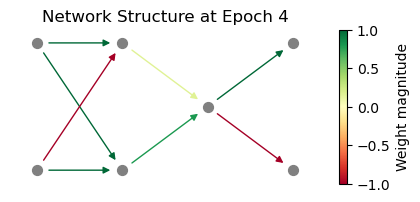

Epoch 5/5 | E=0.07 C=0.62373 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 12.27epoch/s]


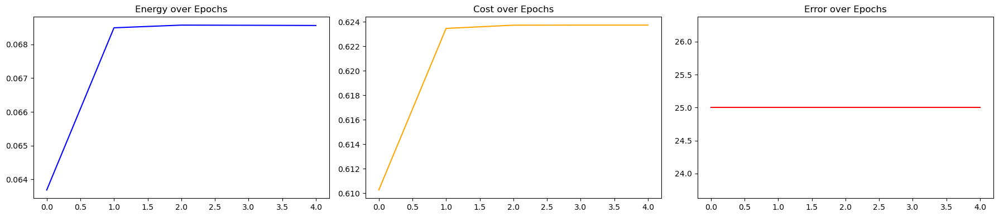

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 1.0000,  0.9994],
        [ 1.0000, -1.0006]]), tensor([[0.7918],
        [0.1565]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1.,  1., -1.,  1.,  1.])


Epoch 1/5 | E=-0.04 C=0.57880 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

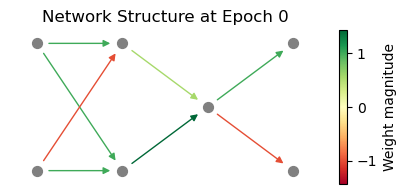

Epoch 2/5 | E=-0.05 C=0.60980 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 12.70epoch/s]

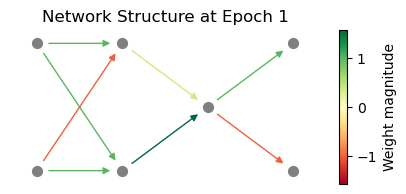

Epoch 3/5 | E=-0.06 C=0.62216 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 11.64epoch/s]

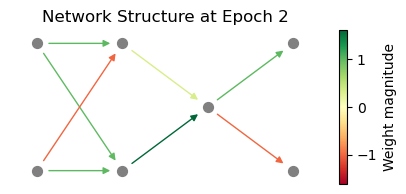

Epoch 4/5 | E=-0.06 C=0.62439 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 11.64epoch/s]

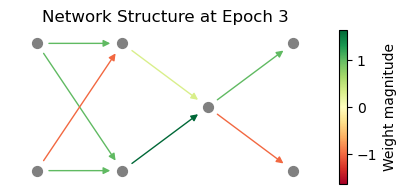

Epoch 5/5 | E=-0.06 C=0.62330 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.07epoch/s]

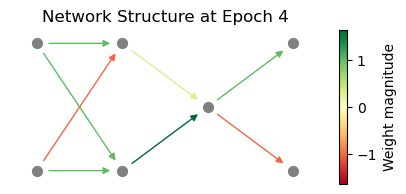

Epoch 5/5 | E=-0.06 C=0.62330 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 10.74epoch/s]


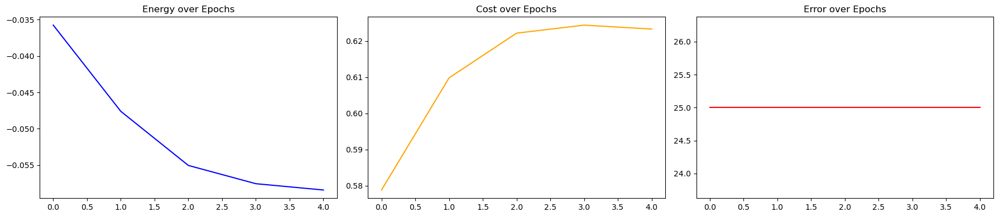

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[ 0.9996,  0.9999],
        [ 1.0004, -1.0001]]), tensor([[1.6369],
        [0.3220]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1.,  1.,  1., -1., -1.])


Epoch 1/5 | E=0.14 C=0.56253 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

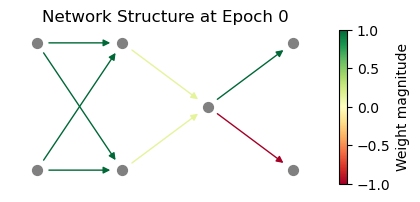

Epoch 2/5 | E=0.29 C=1.06247 Error=75.00%:  20%|██        | 1/5 [00:00<00:00, 12.45epoch/s]

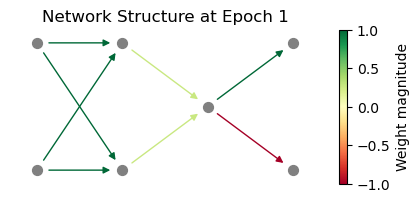

Epoch 3/5 | E=0.19 C=0.56261 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 18.88epoch/s]

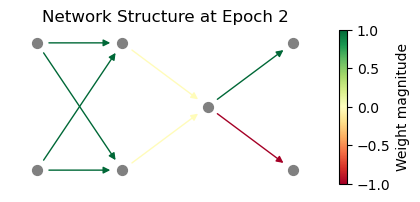

Epoch 4/5 | E=0.15 C=0.56253 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 18.88epoch/s]

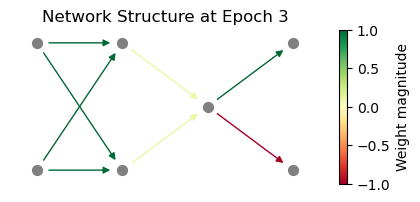

Epoch 5/5 | E=0.10 C=0.56252 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 15.07epoch/s]

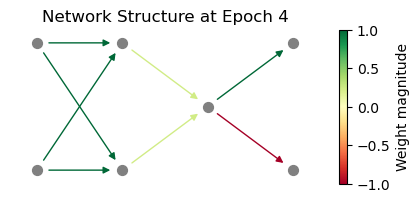

Epoch 5/5 | E=0.10 C=0.56252 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 12.74epoch/s]


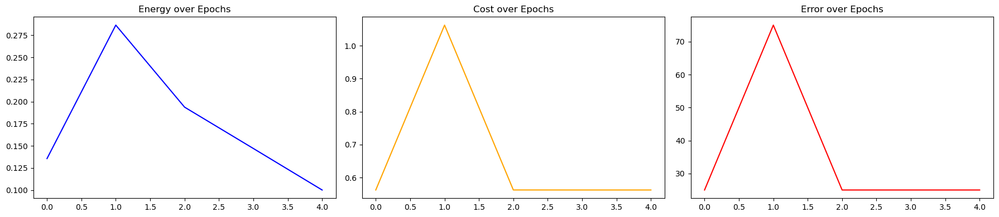

[tensor([0., 0.]), tensor([0., 0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[1.0000, 1.0000],
        [1.0000, 1.0000]]), tensor([[0.2330],
        [0.2330]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1.,  1.,  1., -1.,  1.])


Epoch 1/5 | E=0.18 C=0.25018 Error=0.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

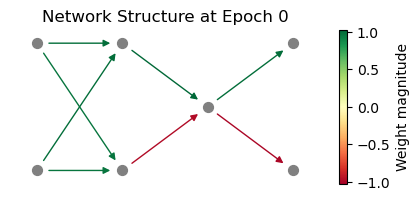

Epoch 2/5 | E=0.18 C=0.25010 Error=0.00%:  20%|██        | 1/5 [00:00<00:00, 17.83epoch/s]

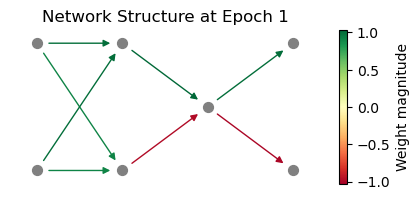

Epoch 3/5 | E=0.17 C=0.25003 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 22.11epoch/s]

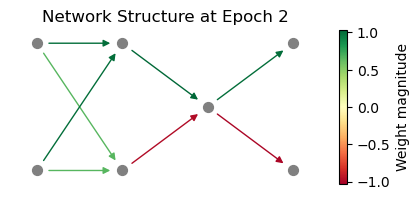

Epoch 4/5 | E=0.25 C=0.25002 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 22.11epoch/s]

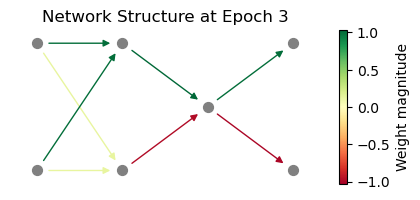

Epoch 5/5 | E=0.23 C=0.56252 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 22.11epoch/s]

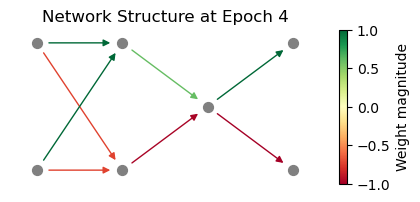

Epoch 5/5 | E=0.23 C=0.56252 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 13.11epoch/s]


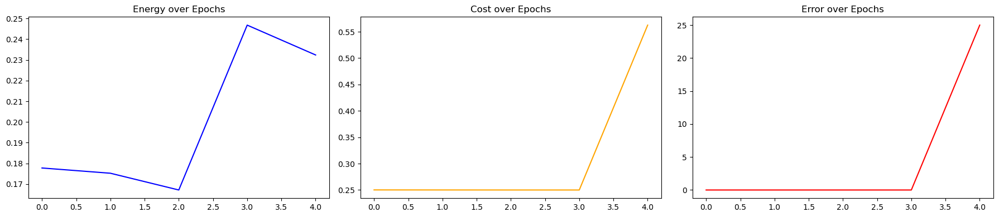

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[-0.7355,  1.0000],
        [-0.7355,  1.0000]]), tensor([[-0.9773],
        [ 0.5941]]), tensor([[-1.,  1.]])]
tensor([ 1.,  1.,  1.,  1.,  1., -1.])


Epoch 1/5 | E=0.18 C=0.25018 Error=0.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

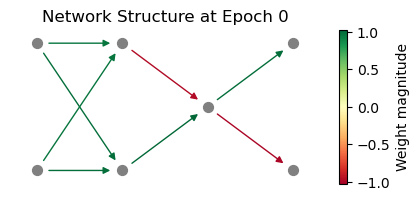

Epoch 2/5 | E=0.18 C=0.25010 Error=0.00%:  20%|██        | 1/5 [00:00<00:00, 13.24epoch/s]

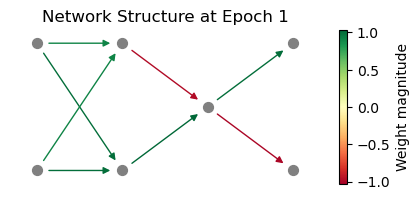

Epoch 3/5 | E=0.17 C=0.25003 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 20.03epoch/s]

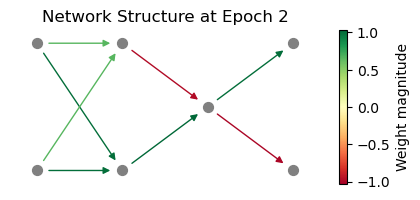

Epoch 4/5 | E=0.25 C=0.25002 Error=0.00%:  60%|██████    | 3/5 [00:00<00:00, 20.03epoch/s]

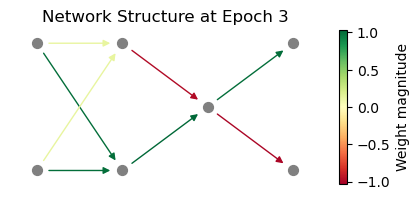

Epoch 5/5 | E=0.23 C=0.56252 Error=25.00%:  80%|████████  | 4/5 [00:00<00:00, 20.03epoch/s]

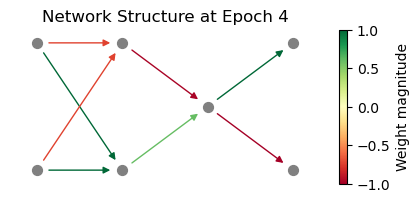

Epoch 5/5 | E=0.23 C=0.56252 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 11.43epoch/s]


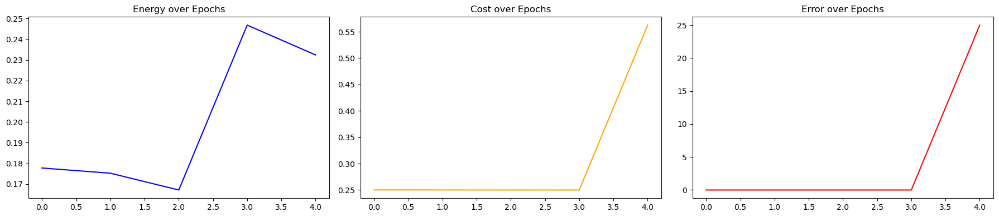

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[ 1.0000, -0.7356],
        [ 1.0000, -0.7356]]), tensor([[ 0.5941],
        [-0.9773]]), tensor([[-1.,  1.]])]
tensor([1., 1., 1., 1., 1., 1.])


Epoch 1/5 | E=0.09 C=0.56252 Error=25.00%:   0%|          | 0/5 [00:00<?, ?epoch/s]

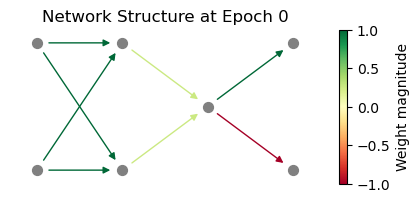

Epoch 2/5 | E=0.18 C=0.56256 Error=25.00%:  20%|██        | 1/5 [00:00<00:00, 11.94epoch/s]

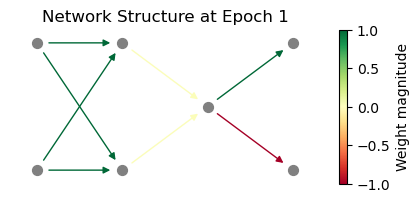

Epoch 3/5 | E=0.13 C=0.56252 Error=25.00%:  60%|██████    | 3/5 [00:00<00:00, 17.06epoch/s]

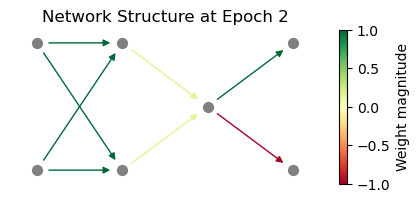

Epoch 4/5 | E=0.29 C=1.06246 Error=75.00%:  60%|██████    | 3/5 [00:00<00:00, 17.06epoch/s]

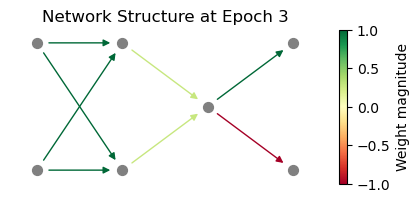

Epoch 5/5 | E=0.19 C=0.56260 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 14.78epoch/s]

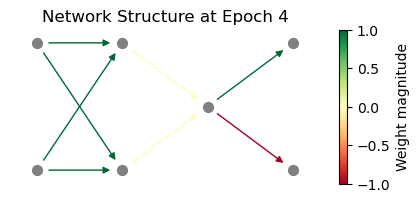

Epoch 5/5 | E=0.19 C=0.56260 Error=25.00%: 100%|██████████| 5/5 [00:00<00:00, 12.34epoch/s]


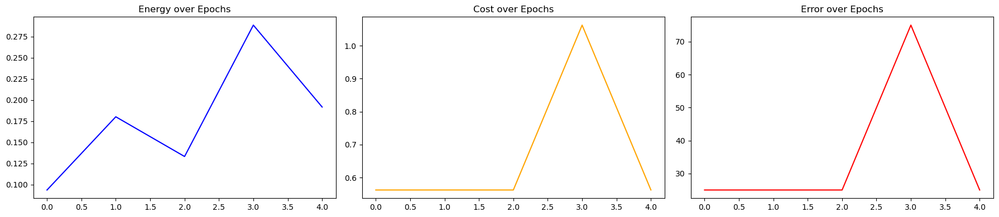

[tensor([0., 0.]), tensor([0., 0.]), tensor([0.]), tensor([0., 0.])]
[tensor([[1.0000, 1.0000],
        [1.0000, 1.0000]]), tensor([[-0.0116],
        [-0.0116]]), tensor([[-1.,  1.]])]


In [14]:
import itertools
import numpy as np
import torch

# Generate all possible combinations of -1, 0, 1 for 9 parameters
all_inits = list(itertools.product([-1.0, 1.0], repeat=6))

results = []

for i, init in enumerate(all_inits):
    xor_net = Network(
        name=f"xor_trial_{i}",
        external_world=xor_world,
        hyperparameters={
            "hidden_sizes": [2, 1],
            "output_size": 2,
            "batch_size": 4,
            "n_epochs": 20,  # just test untrained net
            "n_it_neg": 1,
            "n_it_pos": 1,
            "alphas": [0.1, 0.1, 0.1]
        }
    )

    # Unpack init into weights and biases
    init = torch.tensor(init, dtype=torch.float32)
    W0 = init[:4].reshape(2, 2)
    # b1 = init[4:6]
    W1 = init[4:6].reshape(2, 1)
    # b2 = init[8:]

    with torch.no_grad():
        xor_net.weights[0][:] = W0
        # xor_net.biases[1][:] = b1
        xor_net.weights[1][:] = W1
        # xor_net.biases[2][:] = b2

    print(init)

    # Evaluate the net — assume this function exists
    train_net(xor_net, plot_graph= True)

    print(xor_net.biases)
    print(xor_net.weights)

    # results.append((i, acc.item(), init.numpy()))


Epoch 1/100 | E=0.34 C=0.56262 Error=25.00%:   0%|          | 0/100 [00:00<?, ?epoch/s]

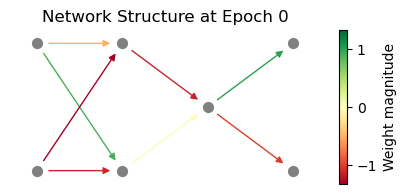

Epoch 25/100 | E=0.34 C=0.56262 Error=25.00%:  24%|██▍       | 24/100 [00:00<00:00, 78.22epoch/s]

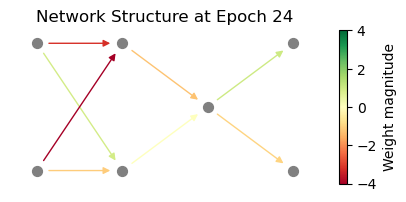

Epoch 50/100 | E=0.35 C=1.05613 Error=75.00%:  49%|████▉     | 49/100 [00:00<00:00, 125.94epoch/s]

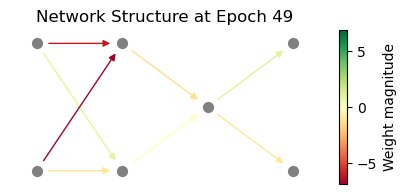

Epoch 75/100 | E=0.34 C=0.56289 Error=25.00%:  74%|███████▍  | 74/100 [00:00<00:00, 170.92epoch/s]

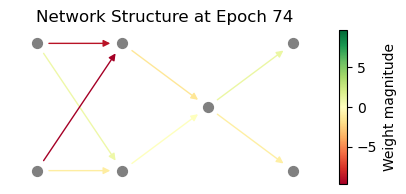

Epoch 100/100 | E=0.34 C=0.56286 Error=25.00%:  99%|█████████▉| 99/100 [00:00<00:00, 138.56epoch/s]

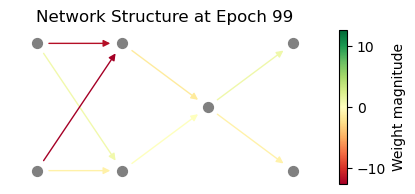

Epoch 100/100 | E=0.34 C=0.56286 Error=25.00%: 100%|██████████| 100/100 [00:00<00:00, 136.55epoch/s]


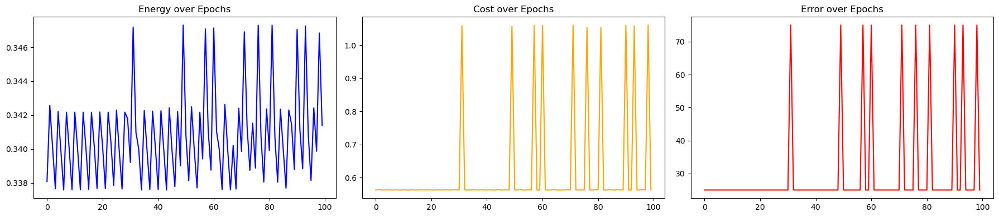

[tensor([0., 0.]), tensor([0., -0.]), tensor([-0.]), tensor([0., 0.])]
[tensor([[  0.8912, -11.7871],
        [ -1.1231, -12.5841]]), tensor([[ 0.0031],
        [-1.5882]]), tensor([[-1.,  1.]])]


In [11]:
import torch.nn as nn
# XOR dataset
xor_x = np.array([[0, 0], [0, 1], [1, 0], [1, 1]] * 10, dtype=np.float32)
xor_y = np.array([0, 1, 1, 0] * 10, dtype=np.int64)

# ExternalWorld instance with XOR data
xor_world = ExternalWorld(xor_x, xor_y)



# small nets can solve xor
xor_net = Network(
    name="xor_net",
    external_world=xor_world,
    hyperparameters={
        "hidden_sizes": [2, 1],
        "output_size": 2,
        "batch_size": 4,
        "n_epochs": 100,
        "n_it_neg": 1,
        "n_it_pos": 1,
        "alphas": [np.float32(0.1), np.float32(0.1),  np.float32(0.05)],
        "activation": "relu"
    }
)

# with torch.no_grad():
#     xor_net.biases = [
#         torch.tensor([0., 0.]),               # Input layer bias (unused)
#         torch.tensor([0., 0.]),               # Hidden layer bias
#         torch.tensor([0.]),                    # Output layer bias
#         torch.tensor([0.0, 0.0])                #classificaiton layer biase
#     ]
    
#     xor_net.weights = [
#         torch.tensor([[-1.,  1.],
#                       [ 1., -1.]]),           # Input → Hidden
#         torch.tensor([[1.],
#                       [1.]]),            # Hidden → Output
#         torch.tensor([[-1.,1.]])    # Final classifier layer (if used)
#     ]



train_net(xor_net, plot_graph= True)

print(xor_net.biases)
print(xor_net.weights)





In [40]:
def train_and_record(net: Network):
    history = {"Energy": [], "Cost": [], "Error": [], "W0_traj": []}
    epochs, batch_size = net.hyperparameters["n_epochs"], net.hyperparameters["batch_size"]
    n_batches = net.dataset_size // batch_size
    n_it_neg, n_it_pos, alphas = net.hyperparameters["n_it_neg"], net.hyperparameters["n_it_pos"], net.hyperparameters["alphas"]

    for epoch in range(epochs):
        for i in range(n_batches):
            net.update_mini_batch_index(i)
            net.negative_phase(n_it_neg)
            net.positive_phase(n_it_pos, *alphas)

        E, C, error = net.measure()
        history["Energy"].append(E)
        history["Cost"].append(C)
        history["Error"].append(error * 100)

        # Save flattened W0 weights for 2D plotting
        w0 = net.weights[0].flatten().detach().cpu().numpy()
        history["W0_traj"].append(w0.copy())

    return history


In [41]:
def compare_initializations(n_trials=10, error_thresh=5.0):
    good_runs, bad_runs = [], []

    for i in range(n_trials):
        net = Network(
            name=f"xor_trial_{i}",
            external_world=xor_world,
            hyperparameters={
                "hidden_sizes": [2, 1],
                "output_size": 2,
                "batch_size": 4,
                "n_epochs": 100,
                "n_it_neg": 1,
                "n_it_pos": 1,
                "alphas": [0.1, 0.1, 0.05]
            }
        )

        # Random init already done in Network constructor
        history = train_and_record(net)

        final_err = history["Error"][-1]
        if final_err < error_thresh:
            good_runs.append(history)
        else:
            bad_runs.append(history)

    return good_runs, bad_runs


In [42]:
def plot_trajectories(runs, title="Trajectory", max_plot=5):
    plt.figure(figsize=(6, 6))
    for i, run in enumerate(runs[:max_plot]):
        traj = np.array(run["W0_traj"])  # shape (epochs, 4)
        plt.plot(traj[:, 0], traj[:, 1], label=f"Run {i}", alpha=0.7)
    plt.title(f"{title} (first 2 dims of W0)")
    plt.xlabel("W0[0]")
    plt.ylabel("W0[1]")
    plt.legend()
    plt.grid(True)
    plt.axis("equal")
    plt.show()


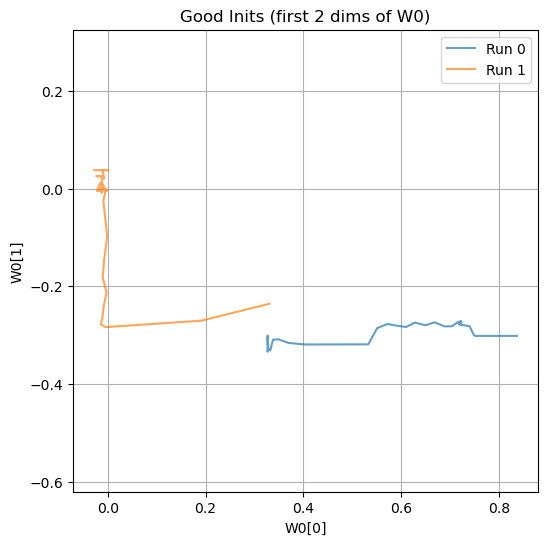

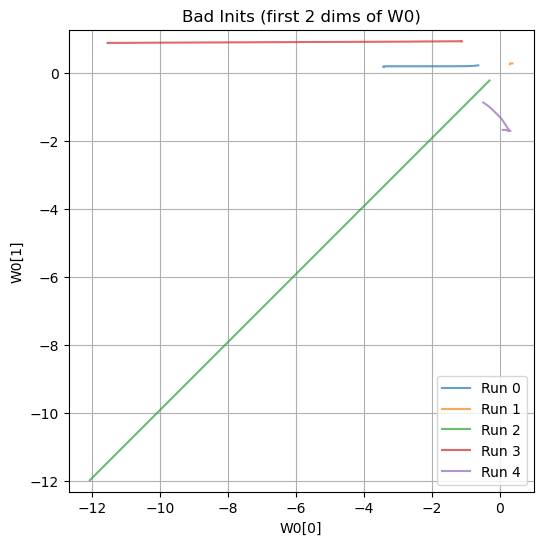

In [43]:
good, bad = compare_initializations(n_trials=20)

plot_trajectories(good, title="Good Inits")
plot_trajectories(bad, title="Bad Inits")
